<a href="https://colab.research.google.com/github/Untick/IrisID_gr2/blob/Sergei-Riuntiu-folder/Sergei%20Riuntiu/IrisID_classification_20_06.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Ноутбук для обработки первичной базы https://cloud.mail.ru/public/ysZs/LAxJdbFb6 и создания новой без засветки в зрачке.

В пункте "Создание обработанной базы" начальные файл должны лежать в виде всех 384 файлов в 1 папке, которую подаем на вход цикла. На выходе такая же структура файлов, т.к. у всех разные подходы к созданию тренировочной базы.

# Импорт Библиотек

In [1]:
import tensorflow as tf
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, Dropout, Flatten, BatchNormalization, Conv2DTranspose, GlobalAveragePooling2D, Lambda, SpatialDropout2D, concatenate, Activation
from keras.layers import Resizing
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16
from keras import utils
from sklearn.model_selection import train_test_split
from google.colab import drive
import matplotlib.pyplot as plt
import os
from PIL import Image
import numpy as np
import random
import gc
import shutil
import zipfile
import cv2

from keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.callbacks import LambdaCallback, ModelCheckpoint, CSVLogger

from scipy.ndimage import gaussian_laplace
from skimage.filters import gabor
from skimage.color import rgb2gray

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Загрузка и подготовка данных

In [ ]:
path_dir_zip = '/content/drive/MyDrive/IrisID/iris_db/zip'
path_extract = '/content/drive/MyDrive/IrisID/iris_db/unzip'
path_train = '/content/drive/MyDrive/IrisID/iris_db/Train'
path_test = '/content/drive/MyDrive/IrisID/iris_db/Test'

In [48]:



def unzip(zip_file_path, extract_to):
    if os.path.exists(extract_to):
        shutil.rmtree(extract_to)
    os.makedirs(extract_to)
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)


def create_dir(path_dir):
    try:
        if os.path.exists(path_dir):
            shutil.rmtree(path_dir)
        os.makedirs(path_dir)
    except OSError as e:
        print(f"Ошибка при создании директории {path_dir}: {e}")


def del_dir(path_dir):
    try:
        os.rmdir(path_dir)
    except OSError as e:
        print(f"Ошибка при удалении папки {path_dir}: {e}")

def move_file(file_path, move_to):
    try:
        if not os.path.exists(move_to):
            os.makedirs(move_to)

        file_name = os.path.basename(file_path)
        new_path = os.path.join(move_to,file_name)

        shutil.move(file_path, new_path)
    except Exception as e:
        print(f'Ошибка при перемещении файла: {e}')

def Check_files(path_folder):
    folders_path = os.listdir(path_folder)
    for folder in folders_path:
        path_fife = os.path.join(path_folder, folder)
        files = os.listdir(path_fife)
        for file in files:
            file_name = str(file).split('_')[0]
            if file_name != str(folder):
                print(f'Файл {file_name} не принадлежит классу в папке {str(folder)}')

def plot_result(train_acc, val_acc, train_loss, val_loss):

  plt.figure(figsize=(16, 10))

  plt.subplot(2, 2, 1)
  plt.title('Точность', fontweight='bold')
  plt.plot(train_acc, label='Точность на обучащей выборке')
  plt.plot(val_acc, label='Точность на проверочной выборке')
  plt.xlabel('Эпоха обучения')
  plt.ylabel('Доля верных ответов')
  plt.legend()

  plt.subplot(2, 2, 2)
  plt.title('Ошибка', fontweight='bold')
  plt.plot(train_loss, label='Ошибка на обучающей выборке')
  plt.plot(val_loss, label='Ошибка на проверочной выборке')
  plt.xlabel('Эпоха обучения')
  plt.ylabel('Ошибка')
  plt.legend()

  plt.show()

In [ ]:
# Создание директорий
create_dir(path_train)
create_dir(path_test)
create_dir(path_extract)

In [ ]:
# Извелечение и распределение файлов
files_zip = os.listdir(path_dir_zip)
for file_zip in files_zip:
    path_file_zip = os.path.join(path_dir_zip, file_zip)
    extract_to = os.path.join(path_extract, file_zip[:-4])
    unzip(path_file_zip, extract_to)

folders_unzip_dir = os.listdir(path_extract)
for folder_unzip in folders_unzip_dir:
    path_folder_unzip = os.path.join(path_extract, folder_unzip)
    img_files = os.listdir(path_folder_unzip)
    for img_file in img_files:
        file_path = os.path.join(path_folder_unzip, img_file)
        folder = os.path.splitext(img_file)[0][:-2]
        move_to = os.path.join(path_train, folder)
        move_file(file_path, move_to)
    # del_dir(path_folder_unzip)

folders_train = os.listdir(path_train)
for folder_train in folders_train:
    path_img_train = os.path.join(path_train, folder_train)
    img_files_train = os.listdir(path_img_train)
    img_files_train.sort()
    for img_file_train in img_files_train:
        file_path = os.path.join(path_img_train, img_file_train)
        folder = os.path.splitext(img_file_train)[0][:-2]
        move_to = os.path.join(path_test, folder)
        move_file(file_path, move_to)
        break

# del_dir(path_extract)
# Check_files(path_test)
# Check_files(path_train)


In [ ]:
Check_files(path_test)
Check_files(path_train)

In [ ]:
del_dir(path_extract)

# Удаление артефактов от ламп

In [ ]:
# проверяем содержимое папки

IMAGE_TRAIN_PATH = '/content/drive/MyDrive/IrisID/iris_db/Train' # изображения тренировочной выборки
IMAGE_TEST_PATH = '/content/drive/MyDrive/IrisID/iris_db/Test' # изображения тестовой выборки

IMAGE_FILES_TRAIN = sorted(os.listdir(IMAGE_TRAIN_PATH))
IMAGE_FILES_TEST = sorted(os.listdir(IMAGE_TEST_PATH))

print(IMAGE_FILES_TRAIN[:5])
print(IMAGE_FILES_TEST[:5])

['001L', '001R', '002L', '002R', '003L']
['001L', '001R', '002L', '002R', '003L']


In [ ]:
def plot_cropped_images(crop_method, nrows=2, ncols=4, figsize=(12, 6)):
  fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
  img_title = ''

  for i in range(ncols):
      dirs_path = f'{IMAGE_TRAIN_PATH}/'
      img_path = dirs_path + random.choice(IMAGE_FILES_TRAIN) + '/'
      img_title = random.choice(os.listdir(img_path))

      ax = axes[0, i]
      ax.set_title(img_title)
      ax.imshow(Image.open(img_path + img_title)) # применяем функцию обрезки изображения
      ax = axes[1, i]
      ax.imshow(crop_method(img_path + img_title)) # применяем функцию обрезки изображения
      ax.axis('off')
  # Отображение графика
  plt.tight_layout()
  plt.show()

## Песочница для проверки

Проведены исследования по коррекции засветки зрачка

### Удаление внешней границы радужки

In [ ]:
# создаем функцию обрезки изображения
import cv2

def crop_circular_image(image_path):
    # Загрузка изображения
    image = cv2.imread(image_path)

    # Конвертация из BGR в RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Получение размеров изображения
    height, width, _ = image.shape

    # Создание круглой маски
    mask = np.zeros((height, width), np.uint8)
    center = (width // 2, height // 2)
    radius = int(min(width, height) // 2.025)
    cv2.circle(mask, center, radius, (255, 255, 255), -1)

    # Применение маски к изображению
    circular_image = cv2.bitwise_and(image, image, mask=mask)

    # Вычисление координат верхнего левого угла прямоугольника
    x = int((width - min(width, height)) // 2.1)
    y = int((height - min(width, height)) // 2)

    # Вырезание прямоугольной области из изображения
    cropped_image = circular_image[y:y + min(width, height), x:x + min(width, height)]

    return cropped_image

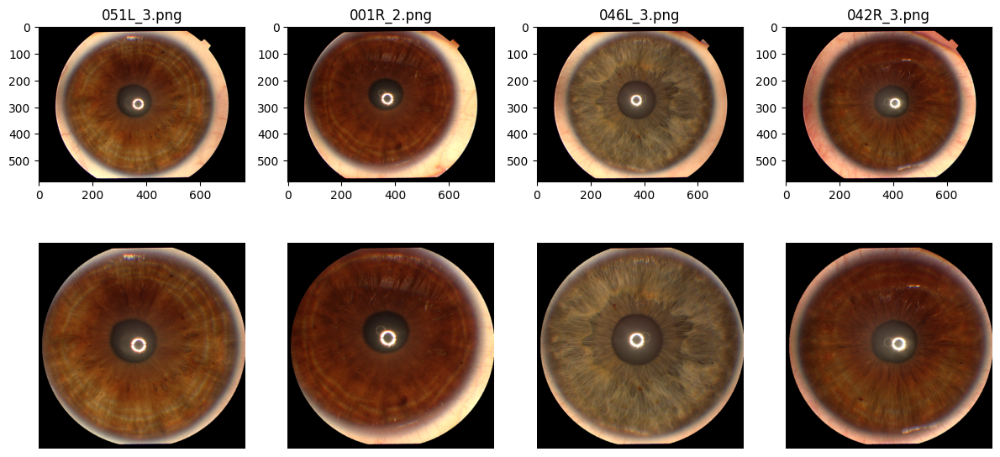

In [ ]:
plot_cropped_images(crop_circular_image)

### Удаление зрачка

In [ ]:
def crop_pupil_center(image_path):
    # Загрузка изображения
    image = cv2.imread(image_path)

    # Конвертация из BGR в RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Получение размеров изображения
    height, width, _ = image.shape

    # Создание круглой маски для зрачка
    mask = np.zeros((height, width), np.uint8)
    center = (width // 2, height // 2)
    radius = int(min(width, height) // 6)
    cv2.circle(mask, center, radius, (255, 255, 255), -1)

    # Применение инвертированной маски к изображению для удаления зрачка
    inverted_mask = cv2.bitwise_not(mask)
    cropped_image = cv2.bitwise_and(image, image, mask=inverted_mask)

    return cropped_image

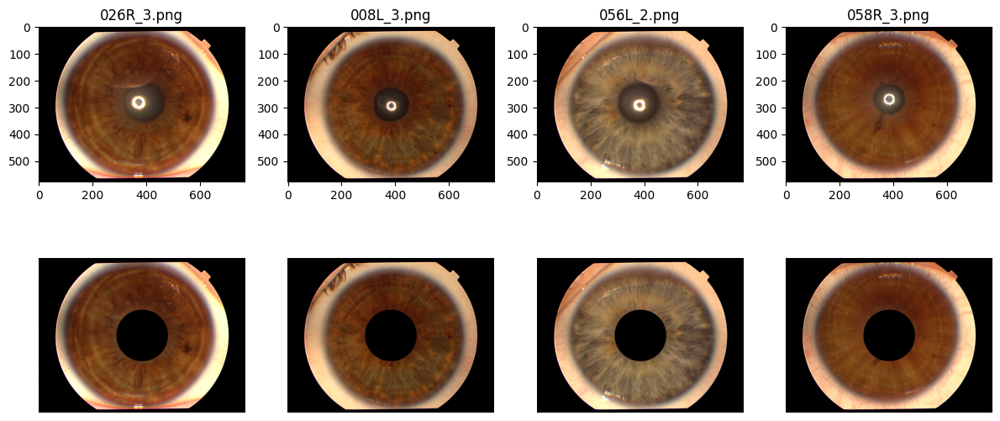

In [ ]:
plot_cropped_images(crop_pupil_center)

### Удаление внешней части и зрачка

In [ ]:
def crop_eye(image_path):
    # Загрузка изображения
    image = cv2.imread(image_path)

    # Конвертация из BGR в RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Получение размеров изображения
    height, width, _ = image.shape

    # Создание круглой маски для внешнего контура радужки
    mask = np.zeros((height, width), np.uint8)
    center = (width // 2, height // 2)
    radius = int(min(width, height) // 2.025)
    cv2.circle(mask, center, radius, (255, 255, 255), -1)

    # Применение маски к изображению
    circular_image = cv2.bitwise_and(image, image, mask=mask)

    # Создание маски для зрачка
    pupil_mask = np.zeros((height, width), np.uint8)
    pupil_center = (width // 2, height // 2)
    pupil_radius = int(min(width, height) // 8)
    cv2.circle(pupil_mask, pupil_center, pupil_radius, (255, 255, 255), -1)

    # Применение инвертированной маски зрачка к изображению для удаления зрачка
    inverted_pupil_mask = cv2.bitwise_not(pupil_mask)
    cropped_image = cv2.bitwise_and(circular_image, circular_image, mask=inverted_pupil_mask)

    return cropped_image

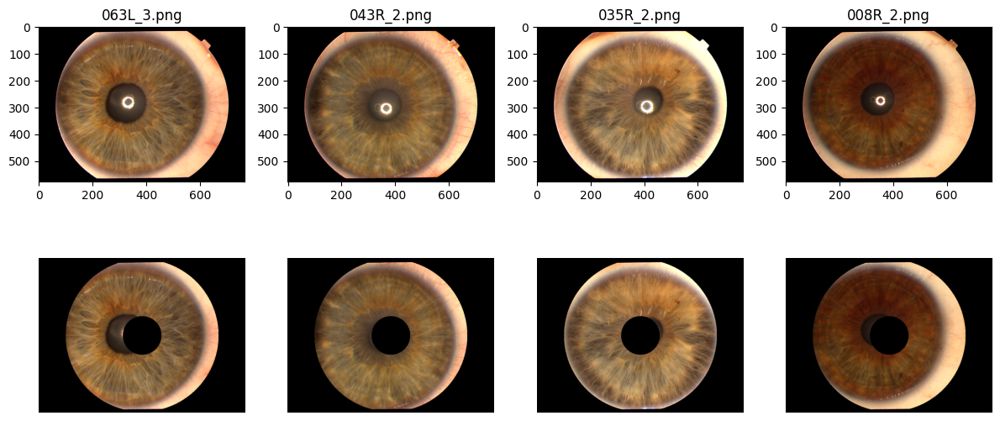

In [ ]:
plot_cropped_images(crop_eye)

### Попытка сдвига зрачка по центру - безуспешно

In [ ]:
 # Попытка сдвига по центру - не удалось
def center_eye(image_path):
    # Загрузка изображения
    image = cv2.imread(image_path)

    # Конвертация из BGR в RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Получение размеров изображения
    height, width, _ = image.shape

    # Создание круглой маски для внешнего контура радужки
    mask = np.zeros((height, width), np.uint8)
    center = (width // 2, height // 2)
    radius = int(min(width, height) // 2.025)
    cv2.circle(mask, center, radius, (255, 255, 255), -1)

    # Применение маски к изображению
    circular_image = cv2.bitwise_and(image, image, mask=mask)

    # Преобразование изображения в оттенки серого
    gray_image = cv2.cvtColor(circular_image, cv2.COLOR_RGB2GRAY)

    # Бинаризация изображения с помощью порогового значения
    _, binary_image = cv2.threshold(gray_image, 1, 255, cv2.THRESH_BINARY)

    # Поиск контуров на бинарном изображении
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Поиск контура зрачка
    pupil_contour = max(contours, key=cv2.contourArea)

    # Вычисление координат ограничивающего прямоугольника зрачка
    x, y, w, h = cv2.boundingRect(pupil_contour)

    # Вычисление центра зрачка
    pupil_center = (int(x + w/2), int(y + h/2))

    # Отметка центра зрачка на изображении красным крестом
    cv2.drawMarker(image, pupil_center, color=(255, 0, 0), markerType=cv2.MARKER_CROSS,
                   markerSize=10, thickness=2)

    # Вычисление сдвига для центрирования по центру зрачка
    shift_x = int(width // 2 - pupil_center[0])
    shift_y = int(height // 2 - pupil_center[1])

    # Сдвиг изображения радужки и зрачка
    centered_image = np.roll(circular_image, shift_x, axis=1)
    centered_image = np.roll(centered_image, shift_y, axis=0)

    # Вычисление координат верхнего левого угла прямоугольника
    x = int((width - min(width, height)) // 2.1)
    y = int((height - min(width, height)) // 2)

    # Вырезание прямоугольной области из изображения
    cropped_image = centered_image[y:y + min(width, height), x:x + min(width, height)]

    return cropped_image

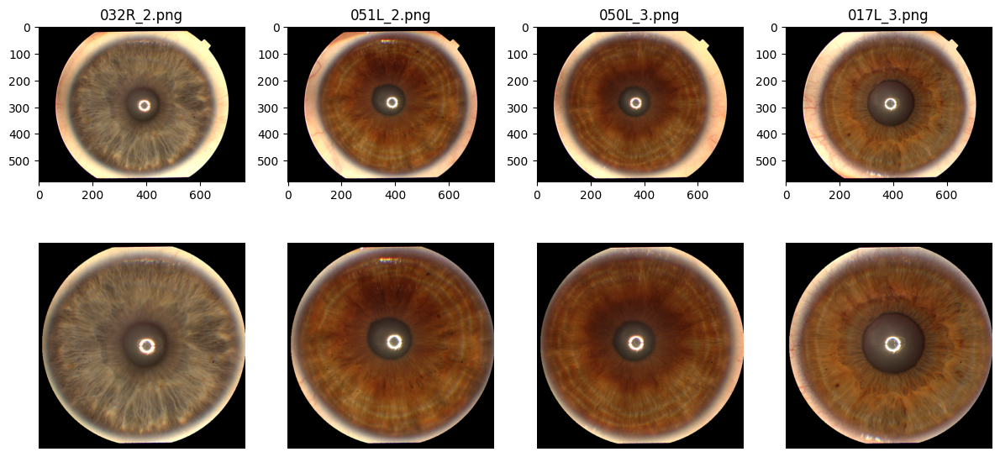

In [ ]:
plot_cropped_images(center_eye)

## Создание обработанной базы

In [ ]:
path_train_ext = '/content/drive/MyDrive/IrisID/iris_db_ext/Train'
path_test_ext = '/content/drive/MyDrive/IrisID/iris_db_ext/Test'

In [ ]:
mkdir /content/drive/MyDrive/IrisID/iris_db_ext/

In [ ]:
def add_ext_to_parent_folder(path):
    # Разделение пути на компоненты
    folder_path, folder_name = os.path.split(path)
    parent_folder_path, parent_folder_name = os.path.split(folder_path)

    # Формирование нового имени родительской папки
    new_parent_folder_name = parent_folder_name + "_ext"

    # Сборка нового пути
    new_path = os.path.join(parent_folder_path, new_parent_folder_name, folder_name)

    return new_path

In [ ]:
path = "/content/drive/MyDrive/IrisID/iris_db/005L"
new_path = add_ext_to_parent_folder(path)
print(new_path)


/content/drive/MyDrive/IrisID/iris_db_ext/005L


In [ ]:
import os
import cv2

def process_images_in_folder(img_path, img_path_new):
    # Получение списка файлов в папке img_path
    file_list = os.listdir(img_path)

    for file_name in file_list:
        # Полный путь к текущему файлу
        file_path = os.path.join(img_path, file_name)

        # Проверка, является ли текущий путь файлом
        if os.path.isfile(file_path):
            # Обработка текущего файла с помощью crop_eye()
            cropped_image = crop_eye(file_path)
            # Конвертация из RGB в BGR
            cropped_image = cv2.cvtColor(cropped_image, cv2.COLOR_RGB2BGR)
            # Имя файла без расширения
            file_name_without_ext = os.path.splitext(file_name)[0]

            # Полный путь к новому файлу
            new_file_path = os.path.join(img_path_new, f"{file_name_without_ext}.png")

            # Сохранение обработанного изображения
            cv2.imwrite(new_file_path, cropped_image)

            print(f"Processed image saved: {new_file_path}")


# Пример использования
img_path_orig = '/content/drive/MyDrive/IrisID/iris_db/'
img_path_new = '/content/drive/MyDrive/IrisID/iris_db_ext/'
process_images_in_folder(img_path_orig, img_path_new)

Processed image saved: /content/drive/MyDrive/IrisID/iris_db_ext/001L_1.png
Processed image saved: /content/drive/MyDrive/IrisID/iris_db_ext/001L_2.png
Processed image saved: /content/drive/MyDrive/IrisID/iris_db_ext/001R_1.png
Processed image saved: /content/drive/MyDrive/IrisID/iris_db_ext/001L_3.png
Processed image saved: /content/drive/MyDrive/IrisID/iris_db_ext/001R_2.png
Processed image saved: /content/drive/MyDrive/IrisID/iris_db_ext/001R_3.png
Processed image saved: /content/drive/MyDrive/IrisID/iris_db_ext/002L_1.png
Processed image saved: /content/drive/MyDrive/IrisID/iris_db_ext/002L_2.png
Processed image saved: /content/drive/MyDrive/IrisID/iris_db_ext/002L_3.png
Processed image saved: /content/drive/MyDrive/IrisID/iris_db_ext/002R_1.png
Processed image saved: /content/drive/MyDrive/IrisID/iris_db_ext/002R_2.png
Processed image saved: /content/drive/MyDrive/IrisID/iris_db_ext/002R_3.png
Processed image saved: /content/drive/MyDrive/IrisID/iris_db_ext/003L_1.png
Processed im

In [ ]:
import shutil

def move_files_to_folders(root_dir):
    # Создание папок Test и Train, если они не существуют
    test_dir = os.path.join(root_dir, "Test")
    train_dir = os.path.join(root_dir, "Train")
    os.makedirs(test_dir, exist_ok=True)
    os.makedirs(train_dir, exist_ok=True)

    # Получение списка файлов в директории iris_db_ext
    files = os.listdir(root_dir)
    for file in files:
        if file.endswith(".png"):
            # Разбиение имени файла на части
            parts = file.split("_")
            prefix = parts[0]  # Префикс (например, 001L)
            suffix = parts[1]  # Суффикс (например, 1.png)

            # Определение пути для перемещения файла
            if suffix == "1.png":
                target_dir = os.path.join(test_dir, prefix)
            else:
                target_dir = os.path.join(train_dir, prefix)

            # Создание папки для перемещения файла, если она не существует
            os.makedirs(target_dir, exist_ok=True)

            # Полный путь к исходному файлу
            source_path = os.path.join(root_dir, file)

            # Полный путь к целевому файлу
            target_path = os.path.join(target_dir, file)

            # Перемещение файла
            shutil.move(source_path, target_path)

# Путь к корневой папке iris_db_ext
root_dir = "/content/drive/MyDrive/IrisID/iris_db_ext"

# Перемещение файлов в папки Test и Train
move_files_to_folders(root_dir)



In [ ]:
rm -rf '/content/drive/MyDrive/IrisID/iris_db_ext/'

In [ ]:
len(os.listdir('/content/drive/MyDrive/IrisID/iris_db_ext/Test/'))

128

In [ ]:
import zipfile

# Путь к папке, которую нужно архивировать
folder_path = '/content/drive/MyDrive/IrisID/iris_db_ext/'

# Имя архива
zip_file_name = 'archive.zip'

# Создание архива
with zipfile.ZipFile(zip_file_name, 'w') as zipf:
    # Рекурсивно добавляем все файлы в папке в архив
    for root, _, files in os.walk(folder_path):
        for file in files:
            file_path = os.path.join(root, file)
            zipf.write(file_path, os.path.relpath(file_path, folder_path))

# Скачивание архива на локальный ПК
from google.colab import files
files.download(zip_file_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Перевод в полярные координаты

In [ ]:
# создаем функцию обрезки изображения

def crop_circular_image2(image_path):
    # Загрузка изображения
    image = cv2.imread(image_path)

    # Конвертация из BGR в RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Получение размеров изображения
    height, width, _ = image.shape

    # Создание круглой маски
    mask = np.zeros((height, width), np.uint8)
    center = (width // 2, height // 2)
    radius = int(min(width, height) // 2.025)
    cv2.circle(mask, center, radius, (255, 255, 255), -1)

    # Применение маски к изображению
    circular_image = cv2.bitwise_and(image, image, mask=mask)

    # Вычисление координат верхнего левого угла прямоугольника
    x = int((width - min(width, height)) // 2.1)
    y = int((height - min(width, height)) // 2)

    # Вырезание прямоугольной области из изображения
    cropped_image = circular_image[y:y + min(width, height), x:x + min(width, height)]

    # Получение размеров обрезанного изображения
    cropped_height, cropped_width, _ = cropped_image.shape

    # Переопределение центра и радиуса для обрезанного изображения
    center = (cropped_width // 2, cropped_height // 2)
    radius = min(cropped_width, cropped_height) // 2

    return cropped_image, center, radius

In [ ]:
# создаем функцию полярного преобразования координат

def unwrap_image(cropped_image, center, radius):
    # создаем новое изображения для результатов развертывания
    unwrapped_image = np.zeros((radius, 360, 3), dtype=np.uint8)

    # пройдем по всем пикселям в новом изображении и копируйте их из обрезанного изображения
    for r in range(radius):
        for theta in range(360):
            # преобразуем полярные координаты в декартовы
            x_unwrap = center[0] + r * np.cos(np.deg2rad(theta))
            y_unwrap = center[1] + r * np.sin(np.deg2rad(theta))

            # копируем пиксель
            unwrapped_image[r, theta] = cropped_image[int(y_unwrap), int(x_unwrap)]

    # обрезание изображения для получения прямоугольника в центре
    rectangle_height = int(radius // 2.5) #  сохраняем центральную треть изображения
    rectangle_start = int((radius - rectangle_height) // 2) # начало прямоугольника
    rectangle_image = unwrapped_image[rectangle_start : rectangle_start + rectangle_height, :]

    return rectangle_image

In [ ]:
# создаем фильтр Гаусса и оператор Лапласа
def apply_gaussian_laplace(image, sigma=1.2):
    # Применение фильтра Гаусса и оператора Лапласа
    filtered_image = gaussian_laplace(image, sigma)

    return filtered_image

# создаем функцию для извлечения признаков с использованием вейвлетов Габора
def apply_gabor_filter(image, frequency=0.7):
    # преобразование изображения в оттенки серого, если оно цветное
    if len(image.shape) > 2:
        image = rgb2gray(image)

    # применение фильтра Габора
    gabor_response, _ = gabor(image, frequency)

    # нормализация gabor_response в диапазон [0, 1]
    gabor_response = (gabor_response - gabor_response.min()) / (gabor_response.max() - gabor_response.min())

    # преобразование gabor_response в тип uint8
    gabor_response = (gabor_response * 255).astype(np.uint8)

    # адаптивная бинаризация изображения
    binary_gabor = cv2.adaptiveThreshold(gabor_response, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

    return binary_gabor

In [ ]:
# cоздаем функцию, применяющую все фильтры к изображению

def process_images(img_path, img_title):
    result = []

    # применяем функцию обрезки изображения
    cropped_image, center, radius = crop_circular_image2(img_path)

    # "Разворачивание" обрезанного изображения
    unwrapped_image = unwrap_image(cropped_image, center, radius)

    # Применение фильтра Гаусса и оператора Лапласа
    gauss_laplace_img = apply_gaussian_laplace(unwrapped_image)

    # Извлечение признаков с использованием вейвлетов Габора
    gabor_img = apply_gabor_filter(gauss_laplace_img)

    # Получаем метку (label) из имени файла
    label = img_title

    # Сохранение результата
    result.append({
        "file_name": img_file,
        "gabor_filter": gabor_img,
        "label": label
    })

    return result

In [ ]:
def print_dictionary_structure(processed_images):
    # Печатаем количество элементов в списке
    print(f'Количество изображений: {len(processed_images)}')
    # Собираем все метки в список
    labels = [image['label'] for image in processed_images]
    # Выводим количество уникальных меток
    print(f'Количество меток: {len(labels)}')

    if processed_images:
        # Получаем первый элемент
        first_image = processed_images[0]

        # Печатаем все ключи и их типы данных
        for key, value in first_image.items():
            print(f'{key}: {type(value)}')

        # Если значение - массив numpy, выводим его форму
        if isinstance(first_image['gabor_filter'], np.ndarray):
            print('Размер изображений:', first_image['gabor_filter'].shape)
    else:
        print("List 'processed_images' is empty.")

NameError: ignored

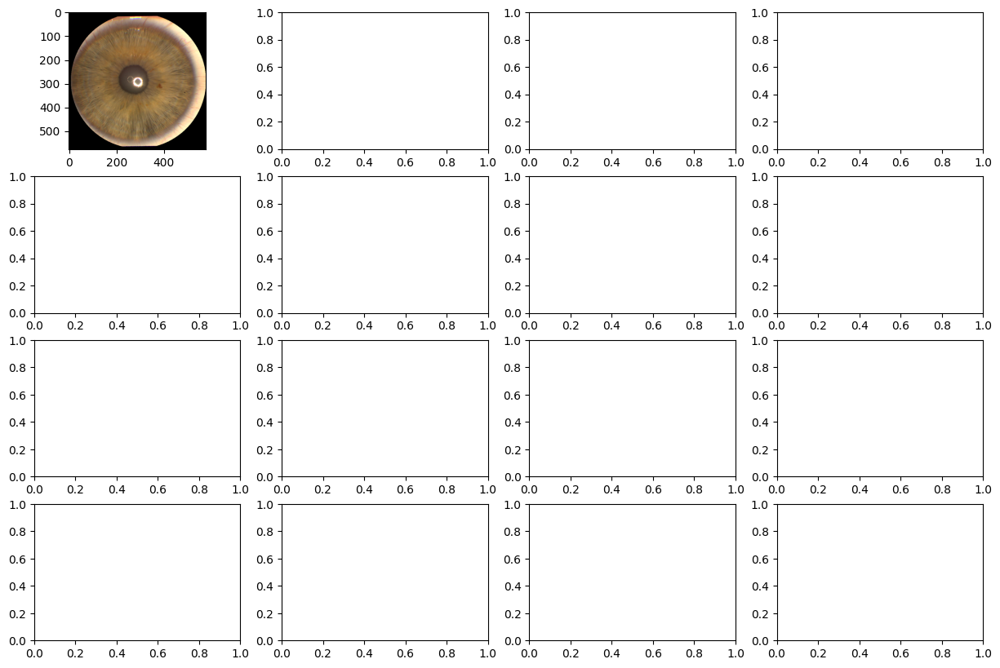

In [ ]:
# выводим результаты применения фильтров

fig, axs = plt.subplots(4, 4, figsize=(15, 10)) # создаем 8 строк по 4 столбца

for i in range(4):
    dirs_path = f'{IMAGE_TRAIN_PATH}/'
    img_path = dirs_path + random.choice(IMAGE_FILES_TRAIN) + '/'
    img_title = random.choice(os.listdir(img_path))

    # Получение обрезанного изображения, центра и радиуса
    cropped_image, center, radius = crop_circular_image2(img_path + img_title)

    # "Разворачивание" обрезанного изображения
    unwrapped_image = unwrap_image(cropped_image, center, radius)

    # Применение фильтра Гаусса и оператора Лапласа
    gaussian_laplace_image = apply_gaussian_laplace(unwrapped_image)

    # Извлечение признаков с использованием вейвлетов Габора
    gabor_features = apply_gabor_filter(unwrapped_image)

    # выводим обрезанное изображение
    axs[i, 0].imshow(cropped_image)
    axs[i, 0].set_title('Cropped: ' + img_file)
    axs[i, 0].axis('off')

    # выводим развернутое изображение
    axs[i, 1].imshow(unwrapped_image)
    axs[i, 1].set_title('Unwrapped: ' + img_file)
    axs[i, 1].axis('off')

    # выводим изображение после применения фильтра Гаусса и оператора Лапласа
    axs[i, 2].imshow(gaussian_laplace_image, cmap='gray')
    axs[i, 2].set_title('Gaussian Laplace: ' + img_file)
    axs[i, 2].axis('off')

    # выводим изображение после извлечения признаков с использованием вейвлетов Габора
    axs[i, 3].imshow(gabor_features, cmap='gray')
    axs[i, 3].set_title('Gabor features: ' + img_file)
    axs[i, 3].axis('off')

plt.tight_layout() # делаем более компактное расположение графиков
plt.show()

# Формирование x_train и y_train

In [3]:
path_train = '/content/drive/MyDrive/IrisID/iris_db_ext/Train'
path_test = '/content/drive/MyDrive/IrisID/iris_db_ext/Test'

In [4]:
Classes = os.listdir(path_train)
Classes.sort()
print(Classes)
print(len(Classes))

['001L', '001R', '002L', '002R', '003L', '003R', '004L', '004R', '005L', '005R', '006L', '006R', '007L', '007R', '008L', '008R', '009L', '009R', '010L', '010R', '011L', '011R', '012L', '012R', '013L', '013R', '014L', '014R', '015L', '015R', '016L', '016R', '017L', '017R', '018L', '018R', '019L', '019R', '020L', '020R', '021L', '021R', '022L', '022R', '023L', '023R', '024L', '024R', '025L', '025R', '026L', '026R', '027L', '027R', '028L', '028R', '029L', '029R', '030L', '030R', '031L', '031R', '032L', '032R', '033L', '033R', '034L', '034R', '035L', '035R', '036L', '036R', '037L', '037R', '038L', '038R', '039L', '039R', '040L', '040R', '041L', '041R', '042L', '042R', '043L', '043R', '044L', '044R', '045L', '045R', '046L', '046R', '047L', '047R', '048L', '048R', '049L', '049R', '050L', '050R', '051L', '051R', '052L', '052R', '053L', '053R', '054L', '054R', '055L', '055R', '056L', '056R', '057L', '057R', '058L', '058R', '059L', '059R', '060L', '060R', '061L', '061R', '062L', '062R', '063L',

In [5]:
batch_size = 64
IMG_WIDTH = 192
IMG_HEIGHT = 144
Channels = 3


In [6]:
# Формирование массивов x_train и y_train
x_train = []
y_train = []
num_class = 0
for cls in Classes:
    path_classes = os.path.join(path_train, cls)
    images = os.listdir(path_classes)
    for img in images:
        path_images = os.path.join(path_classes, img)
        img = Image.open(path_images)
        img = img.resize((IMG_WIDTH, IMG_HEIGHT))
        img_np = np.array(img)
        for i in range(50):
            x_train.append(img_np)
            y_train.append(num_class)

    num_class = num_class + 1

y_train = utils.to_categorical(y_train)
x_train = np.array(x_train)
y_train = np.array(y_train)


print(f'Общий размер базы картинок: {len(x_train)} форма: {x_train.shape}')
print(f'Общий размер базы меток: {len(y_train)} форма: {y_train.shape}')
print(f'Пример метки: {y_train[39]} ')
print(f'Пример метки: {y_train[40]} ')
print(f'Пример метки: {y_train[500]} ')


Общий размер базы картинок: 12800 форма: (12800, 144, 192, 3)
Общий размер базы меток: 12800 форма: (12800, 128)
Пример метки: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.] 
Пример метки: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.] 
Пример метки: [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

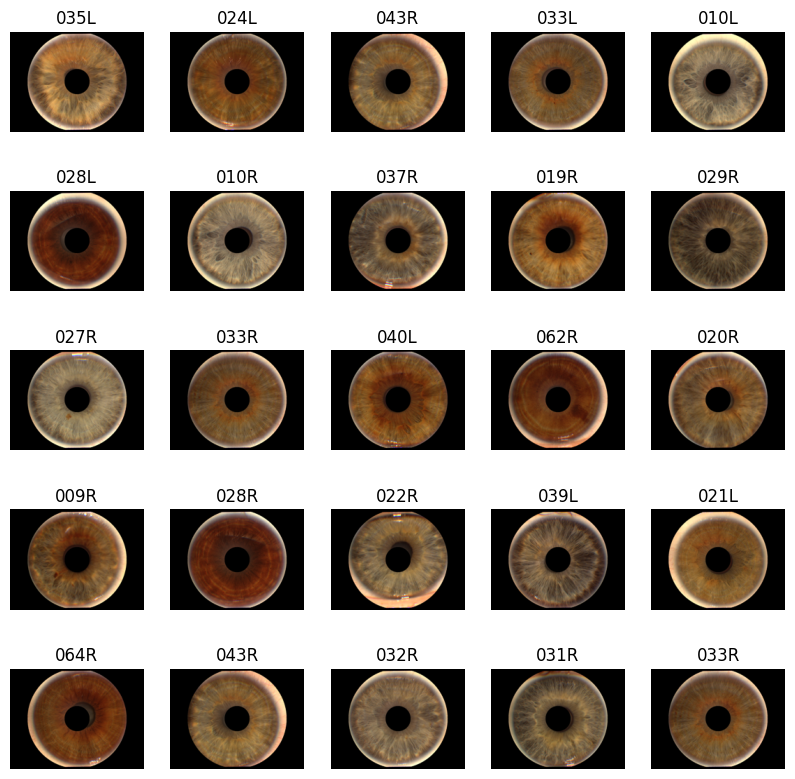

In [7]:
# Примеры картинок с метками
fig = plt.figure(figsize=(10,10))

for i in range(25):
    n = random.randint(0 , x_train.shape[0])
    img = x_train[n]
    label = Classes[np.argmax(y_train[n])]
    ax = fig.add_subplot(5, 5, i+1)
    ax.set_title(label)
    ax.imshow(img)
    ax.axis('off')
plt.show()

In [8]:
VAL_SPLIT = 0.2
ROTATION_RANGE = 4
WIDTH_SHIFT_RANGE = 0.05
HEIGHT_SHIFT_RANGE = 0.05
ZOOM_RANGE = 0.05
BRIGHTNESS_RANGE = (0.8, 1.1)

In [9]:
datagen = ImageDataGenerator(
    rescale=1. / 255.,
    rotation_range=ROTATION_RANGE,
    width_shift_range=WIDTH_SHIFT_RANGE,
    height_shift_range=HEIGHT_SHIFT_RANGE,
    zoom_range=ZOOM_RANGE,
    brightness_range=BRIGHTNESS_RANGE
)



In [10]:
x_train_all, x_train_val, y_train_all, y_train_val = train_test_split(x_train, y_train, test_size = 0.2, shuffle = True)

In [11]:
batch_size = 128

In [12]:
train_generator = datagen.flow(
    x_train_all, y_train_all,
    batch_size=batch_size
    )
val_generator = datagen.flow(
    x_train_val, y_train_val,
    batch_size=batch_size
)

In [13]:
print(f'       Обучающая выборка найдено файлов   {train_generator.n}')
print(f'     Проверочная выборка найдено файлов   {val_generator.n}')
print(f'  Количество батчей в обучающей выборке   {len(train_generator)}')
print(f'Количество батчей в проверочной выборке   {len(val_generator)}')
print(f'                           Размер батча   {train_generator.batch_size}')



       Обучающая выборка найдено файлов   10240
     Проверочная выборка найдено файлов   2560
  Количество батчей в обучающей выборке   80
Количество батчей в проверочной выборке   20
                           Размер батча   128


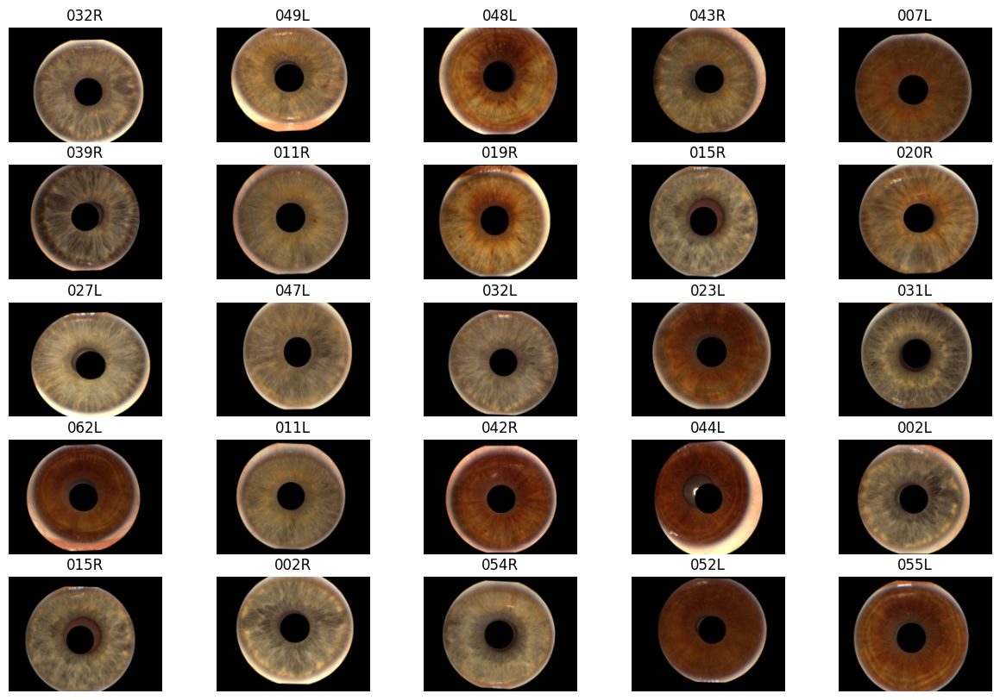

In [ ]:
# Примеры аугментированных картинок с метками

fig = plt.figure(figsize=(15,10))

for i in range(25):
    n = random.randint(0, len(train_generator) - 1)
    k = random.randint(0, train_generator.batch_size-1)
    img = train_generator[n][0][k]
    label = Classes[np.argmax(train_generator[n][1][k])]
    ax = fig.add_subplot(5, 5, i+1)
    ax.set_title(label)
    ax.imshow(img)
    ax.axis('off')
plt.show()


# Обучение сети


## Callbacks

In [89]:
def on_epoch_end(epoch, logs):

  # Начиная с первой эпохи делаем дополнительную логику
  if epoch > 0:

    # Изменяем шаг обучения, если начинается “пила” на графике
    # или график выходит на плато.
    oldLr = round(model.optimizer.lr.numpy(), 4)
    cause = False
    # Что характеризует пилу? Идущее вниз значение val_accuracy.
    if allValAccuracy[epoch - 1] > logs['val_accuracy']:
      cause = 'потенциальная пила'
    # А любое плато начинается с первого ровного участка.
    elif allValAccuracy[epoch - 1] == logs['val_accuracy']:
      cause = 'потенциальное плато'
    if cause:
      # Выводим уведомление, что скорость обучения снижена.
      newLr = round(oldLr / 1.1, 4)
      model.optimizer.learning_rate.assign(newLr)
      print('Уменьшена скорость обучения. Было: {}, стало: {}. Причина: {}.'.format(oldLr, newLr, cause))
    else:
      print('Текущая скорость обучения: {}'.format(round(oldLr, 4)))

    # Сохраняем сеть с лучшей точностью в .h5 файл.
    maxValAccuracy = max(allValAccuracy)
    if maxValAccuracy < logs['val_accuracy']:
      model.save_weights('/content/drive/MyDrive/temp/best_weight.h5')
      print('\nВеса лучшей модели сохранены. Было val_accuracy {}, стало {}'.format(round(maxValAccuracy, 4), logs['val_accuracy']))
    else:
      print('Лучшая модель не изменилась. Mаксимальное val_accuracy: {}'.format(round(maxValAccuracy, 4)))

  # Для нулевой эпохи - просто сохраняем веса модели.
  else:
    model.save_weights('/content/drive/MyDrive/temp/best_weight.h5')
    print('Веса первой итерации сохранены при значении val_accuracy: {}'
    .format(logs['val_accuracy']))

  # Сохраняем текущие значения val_accuracy
  allValAccuracy.append(logs['val_accuracy'])

  print("___________________________________________________________________\n")


##################################################################
##################################################################

# Каллбэки
callback = LambdaCallback(on_epoch_end=on_epoch_end)

In [15]:
# callbacks взят из интернета

save_path = '/content/drive/MyDrive/IrisID/saves/unet-voc'

# Creating saving directory
os.makedirs(save_path, exist_ok=True)

callbacks = [
    # Save the latest weights to be able to continue the optimization at the end for more epochs.
    ModelCheckpoint(os.path.join(save_path, 'last_weights.ckpt')),
    # Save the weights in a new file when the current model is better than all previous models.
    ModelCheckpoint(
        os.path.join(save_path, 'best_weight.ckpt'),
        save_best_only=True,
        restore_best=True,
        verbose=True,
    ),
    # Save the losses for each epoch in a TSV.
    CSVLogger(os.path.join(save_path, 'log.tsv'), separator='\t'),
]

# VGG16

In [ ]:
del model

In [ ]:
#Сборка модели
image_shape = (IMG_HEIGHT, IMG_WIDTH, Channels)

base_model = VGG16(weights='imagenet', include_top=False, input_shape=image_shape)
global_average_layer = GlobalAveragePooling2D()
prediction_layer1 = Dense(1024, activation='relu')
prediction_layer3 = Dense(2048, activation='relu')
prediction_layer2 = Dense(128, activation='softmax')

x = base_model.output
x = global_average_layer(x)
x = Dropout(0.2)(x)
x = prediction_layer1(x)
x = prediction_layer3(x)
outputs = prediction_layer2(x)
model_vgg16 = tf.keras.Model(inputs = base_model.inputs, outputs = outputs)

model_vgg16.summary()

58889256/58889256 [==============================] - 2s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 144, 192, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 144, 192, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 144, 192, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 72, 96, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 72, 96, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 72, 96, 128)       147584    
                                                              

In [ ]:
learning_rate = 0.00001
epochs = 20
allValAccuracy = [0.85]  # требуется для callback

model_vgg16.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


Epoch 1/20
160/160 [==============================] - 115s 580ms/step - loss: 4.4935 - accuracy: 0.0593 - val_loss: 2.9141 - val_accuracy: 0.3238
Epoch 2/20
160/160 [==============================] - 94s 585ms/step - loss: 1.6409 - accuracy: 0.5746 - val_loss: 0.3433 - val_accuracy: 0.9457
Epoch 3/20
160/160 [==============================] - 94s 586ms/step - loss: 0.3712 - accuracy: 0.9039 - val_loss: 0.0339 - val_accuracy: 0.9977
Epoch 4/20
160/160 [==============================] - 94s 587ms/step - loss: 0.1385 - accuracy: 0.9662 - val_loss: 0.0132 - val_accuracy: 0.9996
Epoch 5/20
160/160 [==============================] - 93s 583ms/step - loss: 0.0702 - accuracy: 0.9846 - val_loss: 0.0032 - val_accuracy: 1.0000
Epoch 6/20
160/160 [==============================] - 94s 586ms/step - loss: 0.0402 - accuracy: 0.9913 - val_loss: 0.0027 - val_accuracy: 1.0000
Epoch 7/20
160/160 [==============================] - 94s 588ms/step - loss: 0.0351 - accuracy: 0.9924 - val_loss: 0.0024 - val_a

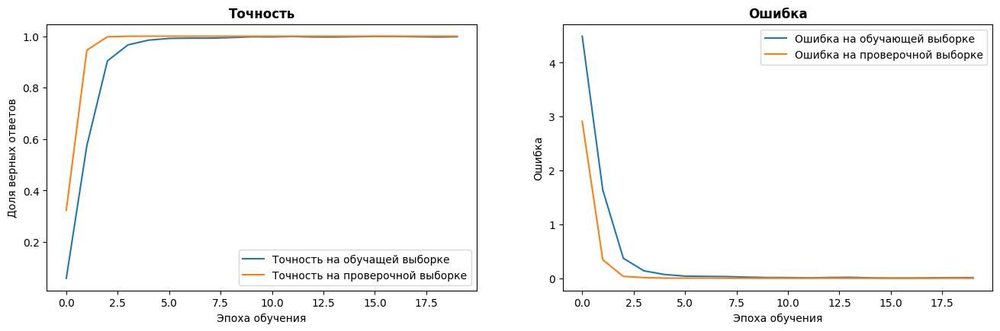

In [ ]:
History = model_vgg16.fit(train_generator,
                    validation_data=val_generator,
                    epochs=epochs,
                    # callbacks=[callback],
                    verbose= 1)

plot_result(History.history['accuracy'],
            History.history['val_accuracy'],
            History.history['loss'],
            History.history['val_loss'])

# Проверка на данных которые модель не видела

In [ ]:
model_vgg16.save('/content/drive/MyDrive/Iris_ID/model_vgg16.h5')

In [ ]:
model_vgg16 = tf.keras.models.load_model('/content/drive/MyDrive/Iris_ID/model_vgg16.h5')
model_vgg16.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 144, 192, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 144, 192, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 144, 192, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 72, 96, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 72, 96, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 72, 96, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 36, 48, 128)       0     

In [ ]:
IMG_WIDTH = 192
IMG_HEIGHT = 144

In [ ]:
Classes = os.listdir(path_test)
Classes.sort()
print(Classes)
print(len(Classes))

['001L', '001R', '002L', '002R', '003L', '003R', '004L', '004R', '005L', '005R', '006L', '006R', '007L', '007R', '008L', '008R', '009L', '009R', '010L', '010R', '011L', '011R', '012L', '012R', '013L', '013R', '014L', '014R', '015L', '015R', '016L', '016R', '017L', '017R', '018L', '018R', '019L', '019R', '020L', '020R', '021L', '021R', '022L', '022R', '023L', '023R', '024L', '024R', '025L', '025R', '026L', '026R', '027L', '027R', '028L', '028R', '029L', '029R', '030L', '030R', '031L', '031R', '032L', '032R', '033L', '033R', '034L', '034R', '035L', '035R', '036L', '036R', '037L', '037R', '038L', '038R', '039L', '039R', '040L', '040R', '041L', '041R', '042L', '042R', '043L', '043R', '044L', '044R', '045L', '045R', '046L', '046R', '047L', '047R', '048L', '048R', '049L', '049R', '050L', '050R', '051L', '051R', '052L', '052R', '053L', '053R', '054L', '054R', '055L', '055R', '056L', '056R', '057L', '057R', '058L', '058R', '059L', '059R', '060L', '060R', '061L', '061R', '062L', '062R', '063L',

In [20]:
# Формирование массивов x_test и y_test
x_test = []
y_test = []

num_class = 0
for cls in Classes:
    path_classes = os.path.join(path_test, cls)
    images = os.listdir(path_classes)
    for img in images:
        path_images = os.path.join(path_classes, img)
        img = Image.open(path_images)
        img = img.resize((IMG_WIDTH, IMG_HEIGHT))
        img_np = np.array(img)
        x_test.append(img_np)
        y_test.append(num_class)
    num_class = num_class + 1

x_test = np.array(x_test)
x_test = x_test / 255
y_test = utils.to_categorical(y_test)
y_test = np.array(y_test)

print(f'Общий размер базы картинок: {len(x_test)} форма: {x_test.shape}')
print(f'Общий размер базы меток: {len(y_test)} форма: {y_test.shape}')
print(f'Пример метки: {y_test[39]} ')
print(f'Пример метки: {y_test[40]} ')
print(f'Пример метки: {y_test[100]} ')

Общий размер базы картинок: 128 форма: (128, 144, 192, 3)
Общий размер базы меток: 128 форма: (128, 128)
Пример метки: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.] 
Пример метки: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.] 
Пример метки: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

1/1 [==============================] - 0s 21ms/step


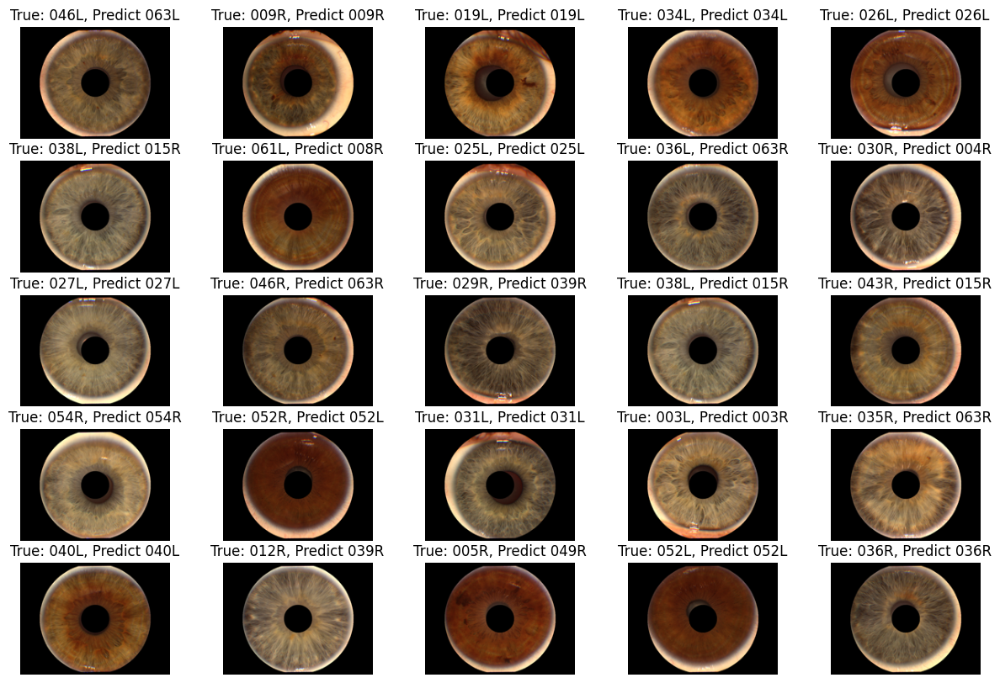

In [ ]:
fig = plt.figure(figsize=(15,10))

for i in range(25):
    n = random.randint(0, len(x_test) - 1)
    img = x_test[n]
    ax = fig.add_subplot(5, 5, i+1)
    ax.imshow(img)
    ax.axis('off')
    img_np = np.array([x_test[n]])
    prediction = model_vgg16.predict(img_np)
    ax.set_title(f'True: {Classes[np.argmax(y_test[n])]}, Predict {Classes[np.argmax(prediction)]}')


plt.show()


### accuracy: 0.9040

In [ ]:
scores = model_vgg16.evaluate(x_test, y_test)

4/4 [==============================] - 1s 190ms/step - loss: 0.5727 - accuracy: 0.9040


400/400 [==============================] - 31s 70ms/step


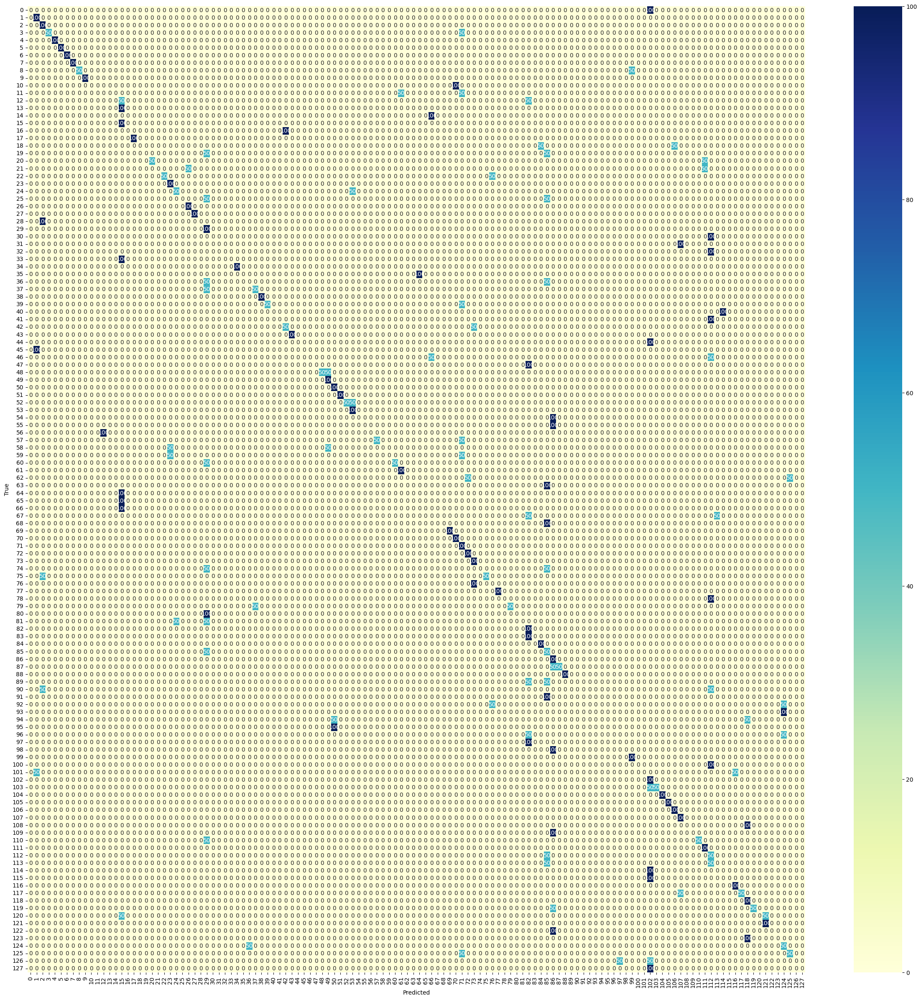

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import tensorflow as tf

y_predict = model_vgg16.predict(x_train);
y_test_classes = [tf.argmax(y_train[i]).numpy() for i in range(len(y_train))]
y_predict_classes = [tf.argmax(y_predict[i]).numpy() for i in range(len(y_predict))]

plt.figure(figsize=(30,30))
confusion_mtx = confusion_matrix(y_test_classes, y_predict_classes)
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='YlGnBu')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

## Дообучение VGG16 - попытка 1

In [ ]:
learning_rate = 0.00005
epochs = 20
allValAccuracy = [0.85]  # требуется для callback

model_vgg16.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


Epoch 1/20
80/80 [==============================] - ETA: 0s - loss: 0.7772 - accuracy: 0.8743


Epoch 1: val_loss improved from inf to 0.00102, saving model to /content/drive/MyDrive/IrisID/saves/unet-voc/best_weight.ckpt


80/80 [==============================] - 131s 1s/step - loss: 0.7772 - accuracy: 0.8743 - val_loss: 0.0010 - val_accuracy: 1.0000
Epoch 2/20
80/80 [==============================] - ETA: 0s - loss: 0.0127 - accuracy: 0.9978


Epoch 2: val_loss improved from 0.00102 to 0.00010, saving model to /content/drive/MyDrive/IrisID/saves/unet-voc/best_weight.ckpt


80/80 [==============================] - 101s 1s/step - loss: 0.0127 - accuracy: 0.9978 - val_loss: 9.5208e-05 - val_accuracy: 1.0000
Epoch 3/20
80/80 [==============================] - ETA: 0s - loss: 0.0143 - accuracy: 0.9968


Epoch 3: val_loss did not improve from 0.00010
80/80 [==============================] - 101s 1s/step - loss: 0.0143 - accuracy: 0.9968 - val_loss: 0.0098 - val_accuracy: 0.9984
Epoch 4/20
80/80 [==============================] - ETA: 0s - loss: 0.0164 - accuracy: 0.9964


Epoch 4: val_loss improved from 0.00010 to 0.00005, saving model to /content/drive/MyDrive/IrisID/saves/unet-voc/best_weight.ckpt


80/80 [==============================] - 102s 1s/step - loss: 0.0164 - accuracy: 0.9964 - val_loss: 5.2765e-05 - val_accuracy: 1.0000
Epoch 5/20
80/80 [==============================] - ETA: 0s - loss: 0.0116 - accuracy: 0.9972


Epoch 5: val_loss did not improve from 0.00005
80/80 [==============================] - 99s 1s/step - loss: 0.0116 - accuracy: 0.9972 - val_loss: 0.0021 - val_accuracy: 1.0000
Epoch 6/20
80/80 [==============================] - ETA: 0s - loss: 0.0055 - accuracy: 0.9989


Epoch 6: val_loss improved from 0.00005 to 0.00002, saving model to /content/drive/MyDrive/IrisID/saves/unet-voc/best_weight.ckpt


80/80 [==============================] - 103s 1s/step - loss: 0.0055 - accuracy: 0.9989 - val_loss: 2.1058e-05 - val_accuracy: 1.0000
Epoch 7/20
80/80 [==============================] - ETA: 0s - loss: 5.3119e-04 - accuracy: 1.0000


Epoch 7: val_loss improved from 0.00002 to 0.00000, saving model to /content/drive/MyDrive/IrisID/saves/unet-voc/best_weight.ckpt


80/80 [==============================] - 102s 1s/step - loss: 5.3119e-04 - accuracy: 1.0000 - val_loss: 2.5144e-06 - val_accuracy: 1.0000
Epoch 8/20
80/80 [==============================] - ETA: 0s - loss: 9.7512e-04 - accuracy: 0.9998


Epoch 8: val_loss did not improve from 0.00000
80/80 [==============================] - 99s 1s/step - loss: 9.7512e-04 - accuracy: 0.9998 - val_loss: 1.7933e-04 - val_accuracy: 1.0000
Epoch 9/20
80/80 [==============================] - ETA: 0s - loss: 0.0248 - accuracy: 0.9935


Epoch 9: val_loss did not improve from 0.00000
80/80 [==============================] - 98s 1s/step - loss: 0.0248 - accuracy: 0.9935 - val_loss: 0.8185 - val_accuracy: 0.7715
Epoch 10/20
80/80 [==============================] - ETA: 0s - loss: 0.1436 - accuracy: 0.9645


Epoch 10: val_loss did not improve from 0.00000
80/80 [==============================] - 99s 1s/step - loss: 0.1436 - accuracy: 0.9645 - val_loss: 1.5285e-04 - val_accuracy: 1.0000
Epoch 11/20
80/80 [==============================] - ETA: 0s - loss: 0.0032 - accuracy: 0.9992


Epoch 11: val_loss did not improve from 0.00000
80/80 [==============================] - 99s 1s/step - loss: 0.0032 - accuracy: 0.9992 - val_loss: 4.0345e-05 - val_accuracy: 1.0000
Epoch 12/20
80/80 [==============================] - ETA: 0s - loss: 7.7124e-04 - accuracy: 1.0000


Epoch 12: val_loss did not improve from 0.00000
80/80 [==============================] - 99s 1s/step - loss: 7.7124e-04 - accuracy: 1.0000 - val_loss: 5.6339e-06 - val_accuracy: 1.0000
Epoch 13/20
80/80 [==============================] - ETA: 0s - loss: 2.8977e-04 - accuracy: 1.0000


Epoch 13: val_loss improved from 0.00000 to 0.00000, saving model to /content/drive/MyDrive/IrisID/saves/unet-voc/best_weight.ckpt


80/80 [==============================] - 104s 1s/step - loss: 2.8977e-04 - accuracy: 1.0000 - val_loss: 1.9132e-06 - val_accuracy: 1.0000
Epoch 14/20
80/80 [==============================] - ETA: 0s - loss: 3.3519e-04 - accuracy: 1.0000


Epoch 14: val_loss did not improve from 0.00000
80/80 [==============================] - 98s 1s/step - loss: 3.3519e-04 - accuracy: 1.0000 - val_loss: 7.7611e-06 - val_accuracy: 1.0000
Epoch 15/20
80/80 [==============================] - ETA: 0s - loss: 4.0067e-04 - accuracy: 1.0000


Epoch 15: val_loss improved from 0.00000 to 0.00000, saving model to /content/drive/MyDrive/IrisID/saves/unet-voc/best_weight.ckpt


80/80 [==============================] - 103s 1s/step - loss: 4.0067e-04 - accuracy: 1.0000 - val_loss: 1.4498e-06 - val_accuracy: 1.0000
Epoch 16/20
80/80 [==============================] - ETA: 0s - loss: 0.0127 - accuracy: 0.9960


Epoch 16: val_loss did not improve from 0.00000
80/80 [==============================] - 100s 1s/step - loss: 0.0127 - accuracy: 0.9960 - val_loss: 0.0232 - val_accuracy: 0.9926
Epoch 17/20
80/80 [==============================] - ETA: 0s - loss: 0.0179 - accuracy: 0.9952


Epoch 17: val_loss did not improve from 0.00000
80/80 [==============================] - 105s 1s/step - loss: 0.0179 - accuracy: 0.9952 - val_loss: 2.7079e-05 - val_accuracy: 1.0000
Epoch 18/20
80/80 [==============================] - ETA: 0s - loss: 3.5768e-04 - accuracy: 1.0000


Epoch 18: val_loss improved from 0.00000 to 0.00000, saving model to /content/drive/MyDrive/IrisID/saves/unet-voc/best_weight.ckpt


80/80 [==============================] - 107s 1s/step - loss: 3.5768e-04 - accuracy: 1.0000 - val_loss: 1.2728e-06 - val_accuracy: 1.0000
Epoch 19/20
80/80 [==============================] - ETA: 0s - loss: 4.2788e-04 - accuracy: 0.9998


Epoch 19: val_loss did not improve from 0.00000
80/80 [==============================] - 100s 1s/step - loss: 4.2788e-04 - accuracy: 0.9998 - val_loss: 2.2858e-05 - val_accuracy: 1.0000
Epoch 20/20
80/80 [==============================] - ETA: 0s - loss: 2.0387e-04 - accuracy: 1.0000


Epoch 20: val_loss improved from 0.00000 to 0.00000, saving model to /content/drive/MyDrive/IrisID/saves/unet-voc/best_weight.ckpt


80/80 [==============================] - 106s 1s/step - loss: 2.0387e-04 - accuracy: 1.0000 - val_loss: 5.0840e-07 - val_accuracy: 1.0000


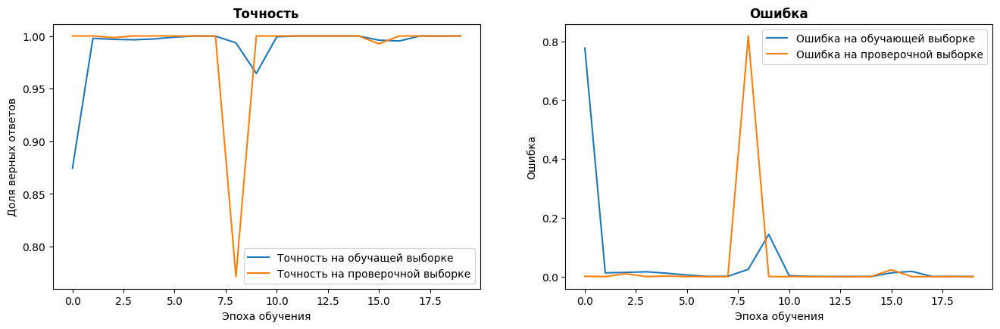

In [ ]:
History = model_vgg16.fit(train_generator,
                    validation_data=val_generator,
                    epochs=epochs,
                    callbacks=[callbacks],
                    verbose= 1)

plot_result(History.history['accuracy'],
            History.history['val_accuracy'],
            History.history['loss'],
            History.history['val_loss'])

In [ ]:
scores = model_vgg16.evaluate(x_test, y_test)

4/4 [==============================] - 3s 76ms/step - loss: 0.7662 - accuracy: 0.8516


400/400 [==============================] - 30s 76ms/step


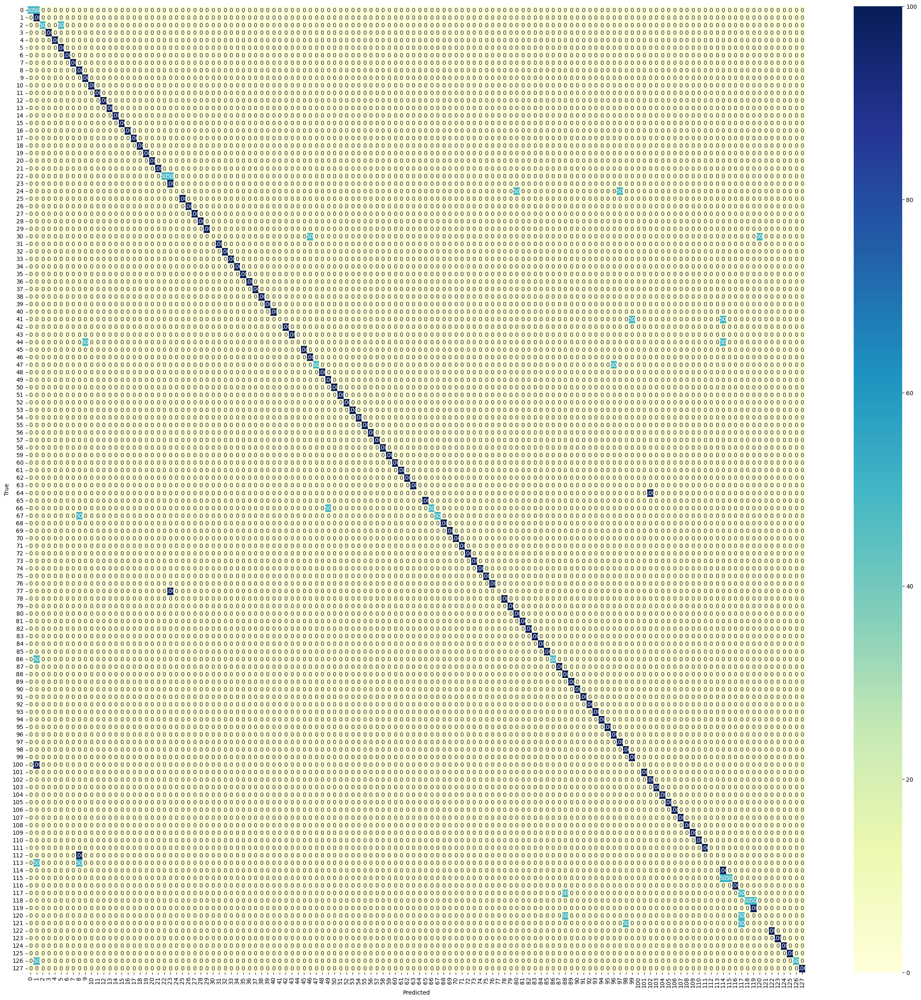

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import tensorflow as tf

y_predict = model_vgg16.predict(x_train);
y_test_classes = [tf.argmax(y_train[i]).numpy() for i in range(len(y_train))]
y_predict_classes = [tf.argmax(y_predict[i]).numpy() for i in range(len(y_predict))]

plt.figure(figsize=(30,30))
confusion_mtx = confusion_matrix(y_test_classes, y_predict_classes)
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='YlGnBu')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

1/1 [==============================] - 0s 23ms/step


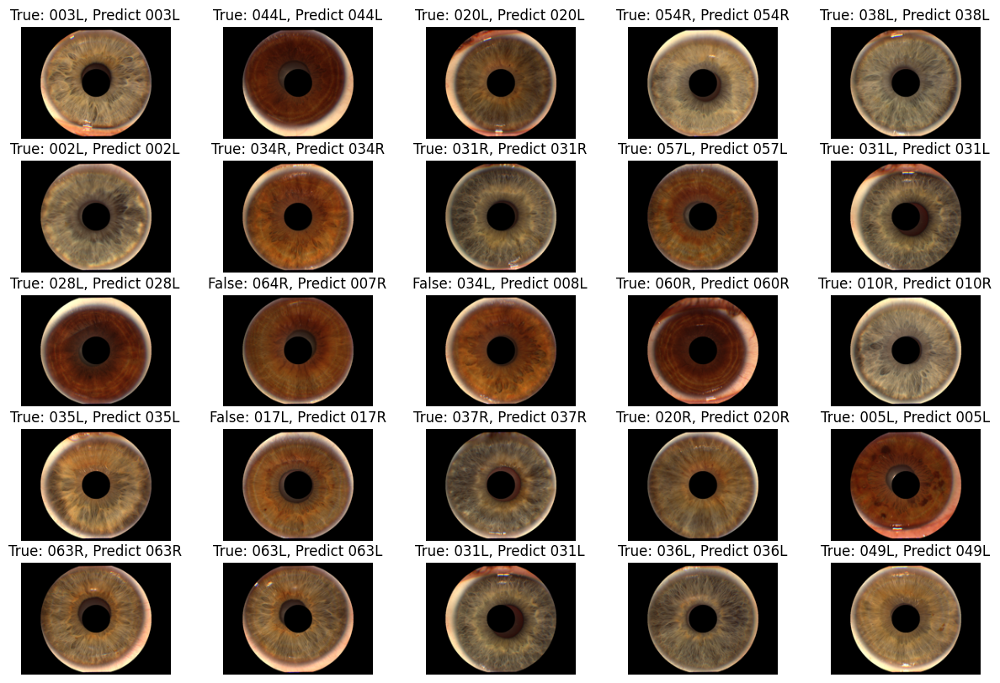

In [ ]:
fig = plt.figure(figsize=(15,10))

for i in range(25):
    n = random.randint(0, len(x_test) - 1)
    img = x_test[n]
    ax = fig.add_subplot(5, 5, i+1)
    ax.imshow(img)
    ax.axis('off')
    img_np = np.array([x_test[n]])
    prediction = model_vgg16.predict(img_np)
    if Classes[np.argmax(y_test[n])] == Classes[np.argmax(prediction)]:
      ax.set_title(f'True: {Classes[np.argmax(y_test[n])]}, Predict {Classes[np.argmax(prediction)]}')
    else:
      ax.set_title(f'False: {Classes[np.argmax(y_test[n])]}, Predict {Classes[np.argmax(prediction)]}')


plt.show()

In [ ]:
model_vgg16.save('/content/drive/MyDrive/Iris_ID/model_vgg16_trained1.h5')

## Дообучение VGG16 - попытка 2

In [ ]:
del model_vgg16

In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/Iris_ID/model_vgg16_trained1.h5')

In [ ]:
learning_rate = 0.0001
epochs = 10
allValAccuracy = [0.85]  # требуется для callback

model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])


Epoch 1/10
80/80 [==============================] - ETA: 0s - loss: 0.4617 - accuracy: 0.9138Веса первой итерации сохранены при значении val_accuracy: 1.0
___________________________________________________________________

80/80 [==============================] - 100s 1s/step - loss: 0.4617 - accuracy: 0.9138 - val_loss: 0.0019 - val_accuracy: 1.0000
Epoch 2/10
80/80 [==============================] - ETA: 0s - loss: 0.0112 - accuracy: 0.9967Текущая скорость обучения: 9.999999747378752e-05
Лучшая модель не изменилась. Mаксимальное val_accuracy: 1.0
___________________________________________________________________

80/80 [==============================] - 97s 1s/step - loss: 0.0112 - accuracy: 0.9967 - val_loss: 5.2337e-05 - val_accuracy: 1.0000
Epoch 3/10
80/80 [==============================] - ETA: 0s - loss: 0.0167 - accuracy: 0.9953Уменьшена скорость обучения. Было: 9.999999747378752e-05, стало: 0.0001. Причина: потенциальное плато.
Лучшая модель не изменилась. Mаксимальное val_

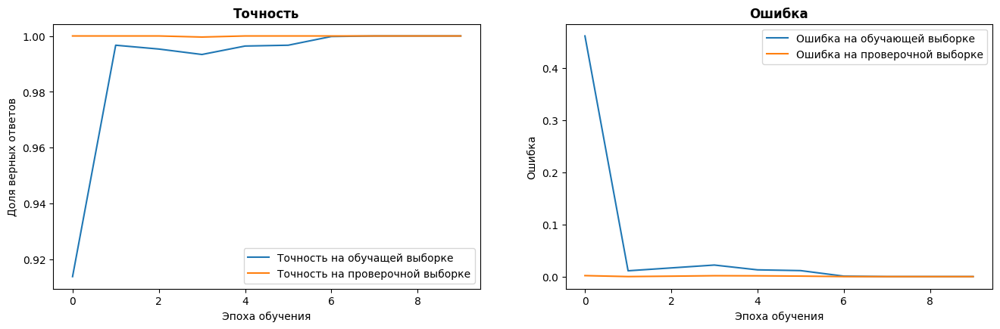

In [ ]:
History = model.fit(train_generator,
                    validation_data=val_generator,
                    epochs=epochs,
                    callbacks=callback,
                    verbose= 1)

plot_result(History.history['accuracy'],
            History.history['val_accuracy'],
            History.history['loss'],
            History.history['val_loss'])

In [ ]:
scores = model.evaluate(x_test, y_test)

4/4 [==============================] - 0s 80ms/step - loss: 0.9788 - accuracy: 0.8203


**accuracy**: 0.8203

400/400 [==============================] - 28s 71ms/step


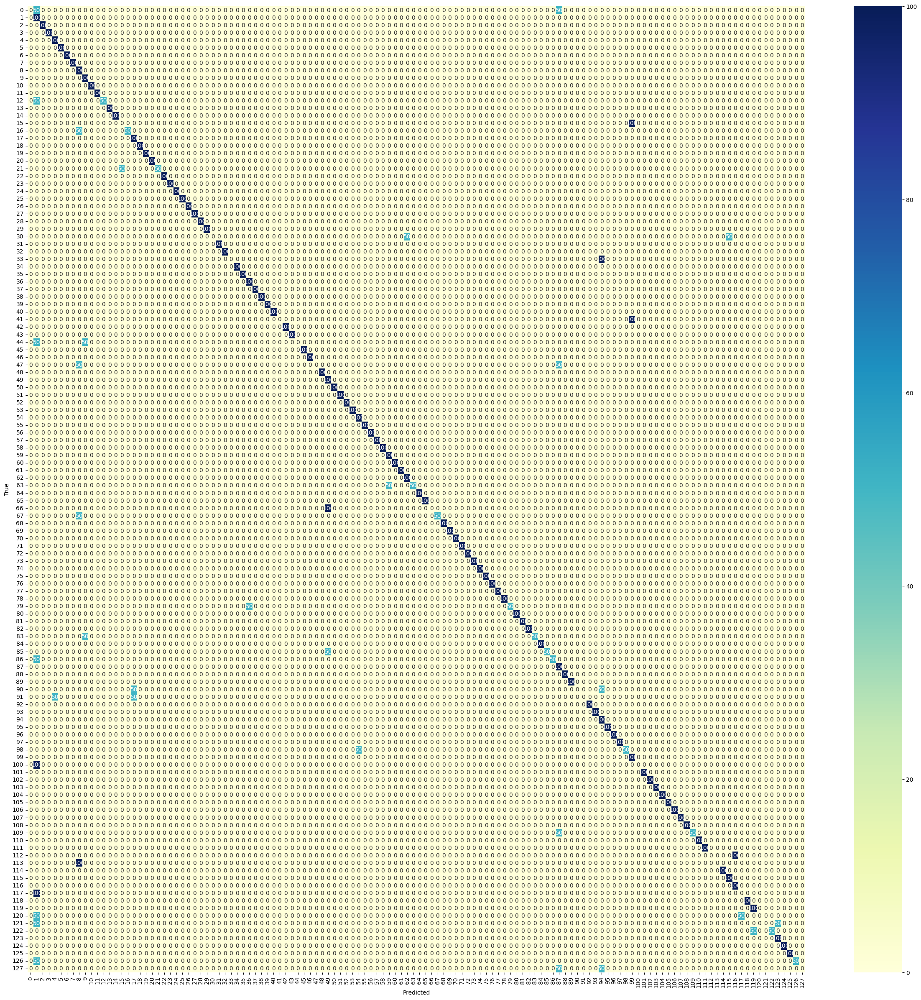

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import tensorflow as tf

y_predict = model.predict(x_train);
y_test_classes = [tf.argmax(y_train[i]).numpy() for i in range(len(y_train))]
y_predict_classes = [tf.argmax(y_predict[i]).numpy() for i in range(len(y_predict))]

plt.figure(figsize=(30,30))
confusion_mtx = confusion_matrix(y_test_classes, y_predict_classes)
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='YlGnBu')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

4/4 [==============================] - 0s 89ms/step


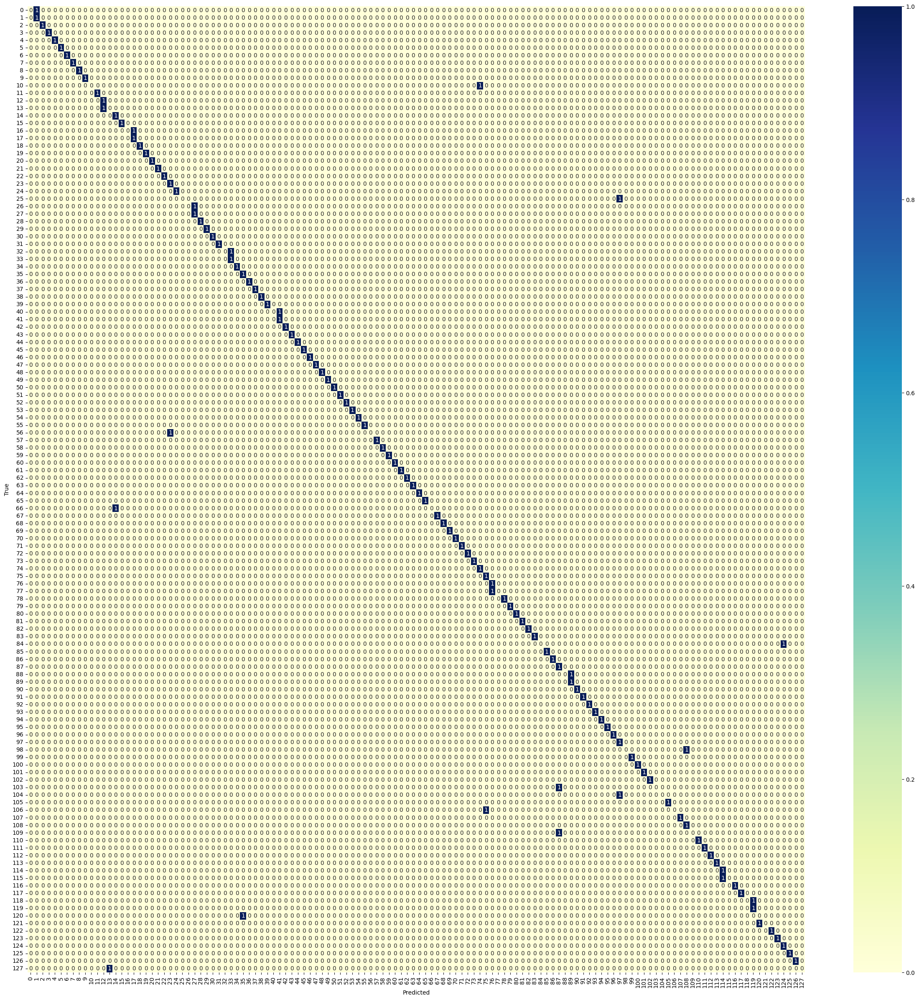

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import tensorflow as tf

y_predict = model.predict(x_test);
y_test_classes = [tf.argmax(y_test[i]).numpy() for i in range(len(y_test))]
y_predict_classes = [tf.argmax(y_predict[i]).numpy() for i in range(len(y_predict))]

plt.figure(figsize=(30,30))
confusion_mtx = confusion_matrix(y_test_classes, y_predict_classes)
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='YlGnBu')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

1/1 [==============================] - 0s 21ms/step


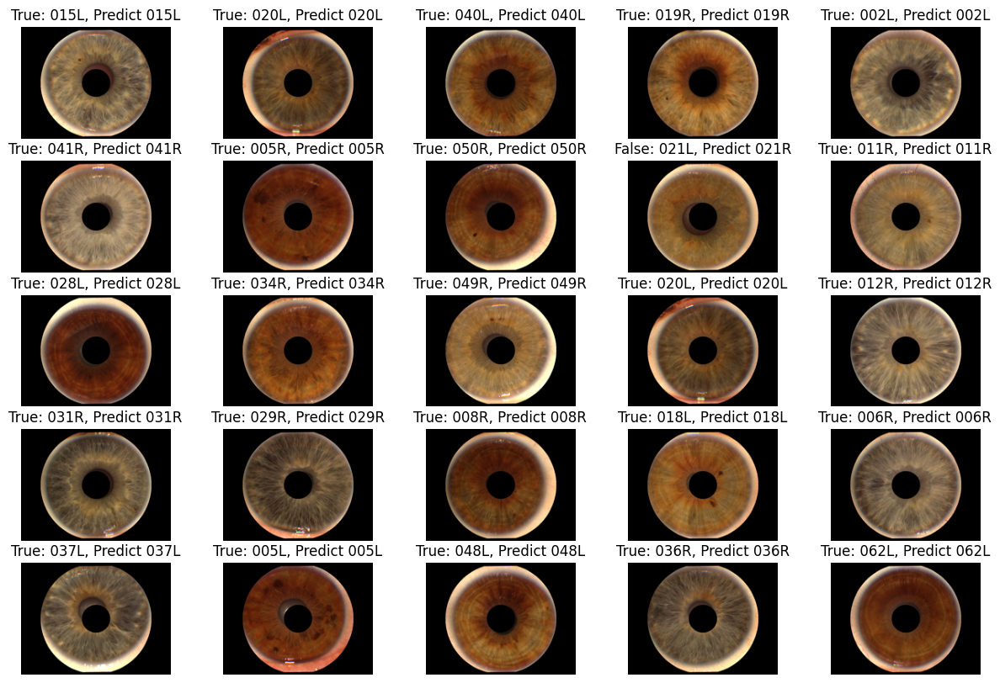

In [ ]:
fig = plt.figure(figsize=(15,10))

for i in range(25):
    n = random.randint(0, len(x_test) - 1)
    img = x_test[n]
    ax = fig.add_subplot(5, 5, i+1)
    ax.imshow(img)
    ax.axis('off')
    img_np = np.array([x_test[n]])
    prediction = model.predict(img_np)
    if Classes[np.argmax(y_test[n])] == Classes[np.argmax(prediction)]:
      ax.set_title(f'True: {Classes[np.argmax(y_test[n])]}, Predict {Classes[np.argmax(prediction)]}')
    else:
      ax.set_title(f'False: {Classes[np.argmax(y_test[n])]}, Predict {Classes[np.argmax(prediction)]}')


plt.show()

# Resnet

In [ ]:
%load_ext tensorboard

In [17]:
import tensorflow as tf
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import Lambda
from keras.layers import Input
from keras import backend as K

# image_shape = (IMG_HEIGHT, IMG_WIDTH, 1)
image_shape = (IMG_HEIGHT, IMG_WIDTH, Channels)
# Преобразование входного изображения к формату (высота, ширина, 3)
model_input = Input(shape=image_shape)
# x = Lambda(lambda image: K.repeat_elements(image, 3, axis=3))(model_input)

# Использование ResNet50 с измененным входным изображением
# base_model = ResNet50(weights='imagenet', include_top=False, input_tensor=x)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=image_shape)
global_average_layer = GlobalAveragePooling2D()
prediction_layer1 = Dense(512, activation='relu')
prediction_layer2 = Dense(1024, activation='relu')
prediction_layer3 = Dense(128, activation='softmax')

x = base_model.output
x = global_average_layer(x)
x = Dropout(0.2)(x)
x = prediction_layer1(x)
# x = Dropout(0.2)(x)
x = prediction_layer2(x)
# x = Dropout(0.2)(x)
outputs = prediction_layer3(x)

model_ResNet = tf.keras.Model(inputs=base_model.input, outputs=outputs)

94765736/94765736 [==============================] - 0s 0us/step


In [ ]:
model_ResNet.summary()

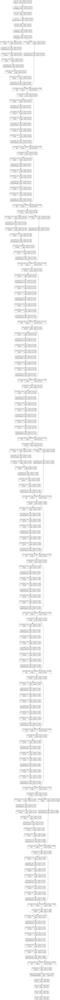

In [27]:
from tensorflow.keras.utils import plot_model
# Визуализация структуры слоев нейросети
plot_model(model_ResNet, show_shapes=True, show_layer_names=True)

In [ ]:
del History

## Resnet - первая попытка

In [18]:
del model_ResNet

In [ ]:
learning_rate = 0.0002
epochs = 10
allValAccuracy = [0.00]  # требуется для callback

Epoch 1/10
80/80 [==============================] - ETA: 0s - loss: 0.8350 - accuracy: 0.8572Веса первой итерации сохранены при значении val_accuracy: 0.006640625186264515
___________________________________________________________________

80/80 [==============================] - 95s 1s/step - loss: 0.8350 - accuracy: 0.8572 - val_loss: 4.8695 - val_accuracy: 0.0066
Epoch 2/10
80/80 [==============================] - ETA: 0s - loss: 5.6413e-04 - accuracy: 1.0000Текущая скорость обучения: 9.999999747378752e-05

Веса лучшей модели сохранены. Было val_accuracy 0.0066, стало 0.00937500037252903
___________________________________________________________________

80/80 [==============================] - 90s 1s/step - loss: 5.6413e-04 - accuracy: 1.0000 - val_loss: 4.8679 - val_accuracy: 0.0094
Epoch 3/10
80/80 [==============================] - ETA: 0s - loss: 2.9329e-04 - accuracy: 1.0000Текущая скорость обучения: 9.999999747378752e-05
Лучшая модель не изменилась. Mаксимальное val_accurac

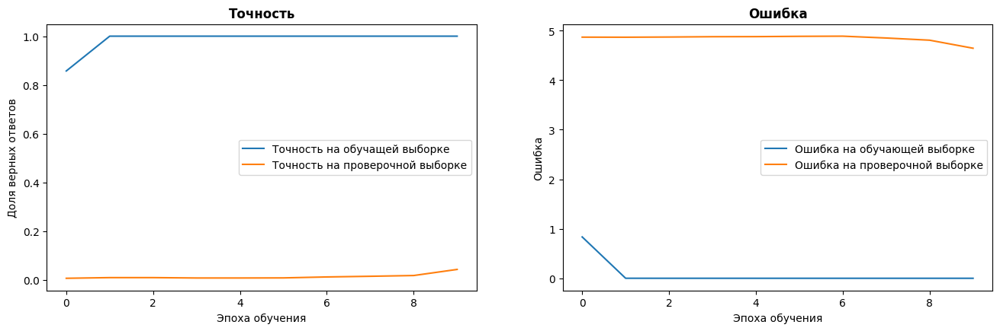

In [ ]:
model_ResNet.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

History = model_ResNet.fit(train_generator,
                    validation_data=val_generator,
                    epochs=epochs,
                    callbacks = callback,
                    verbose= 1)

plot_result(History.history['accuracy'],
            History.history['val_accuracy'],
            History.history['loss'],
            History.history['val_loss'])

**Модель перестала обучаться**

## Resnet - вторая попытка

Epoch 1/10
80/80 [==============================] - ETA: 0s - loss: 0.0229 - accuracy: 0.9949Веса первой итерации сохранены при значении val_accuracy: 0.01406249962747097
___________________________________________________________________

80/80 [==============================] - 94s 1s/step - loss: 0.0229 - accuracy: 0.9949 - val_loss: 13.0772 - val_accuracy: 0.0141
Epoch 2/10
80/80 [==============================] - ETA: 0s - loss: 0.0131 - accuracy: 0.9975Текущая скорость обучения: 9.999999747378752e-05

Веса лучшей модели сохранены. Было val_accuracy 0.043, стало 0.3714843690395355
___________________________________________________________________

80/80 [==============================] - 87s 1s/step - loss: 0.0131 - accuracy: 0.9975 - val_loss: 3.0962 - val_accuracy: 0.3715
Epoch 3/10
80/80 [==============================] - ETA: 0s - loss: 0.0225 - accuracy: 0.9948Текущая скорость обучения: 9.999999747378752e-05

Веса лучшей модели сохранены. Было val_accuracy 0.3715, стало 0.41

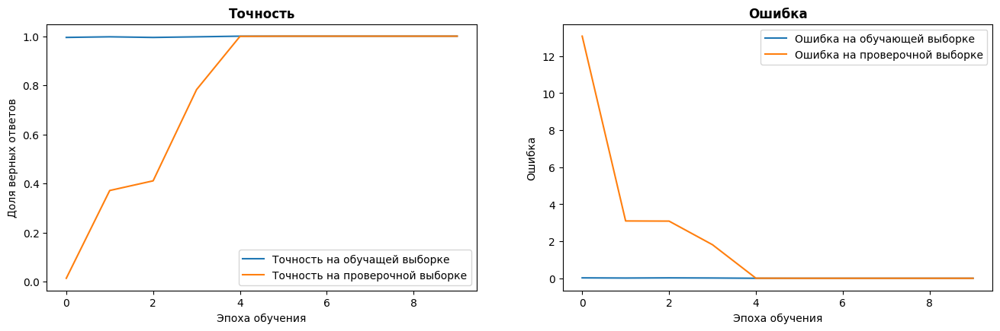

In [ ]:
model_ResNet.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

History = model_ResNet.fit(train_generator,
                    validation_data=val_generator,
                    epochs=epochs,
                    callbacks = callback,
                    verbose= 1)

plot_result(History.history['accuracy'],
            History.history['val_accuracy'],
            History.history['loss'],
            History.history['val_loss'])

In [ ]:
batch_size = 128

In [21]:
test_generator = datagen.flow(
    x_test, y_test,
    batch_size=batch_size
    )

In [25]:
model_ResNet = tf.keras.models.load_model('/content/drive/MyDrive/Iris_ID/model_ResNet_ext.h5')

1/1 [==============================] - 0s 23ms/step


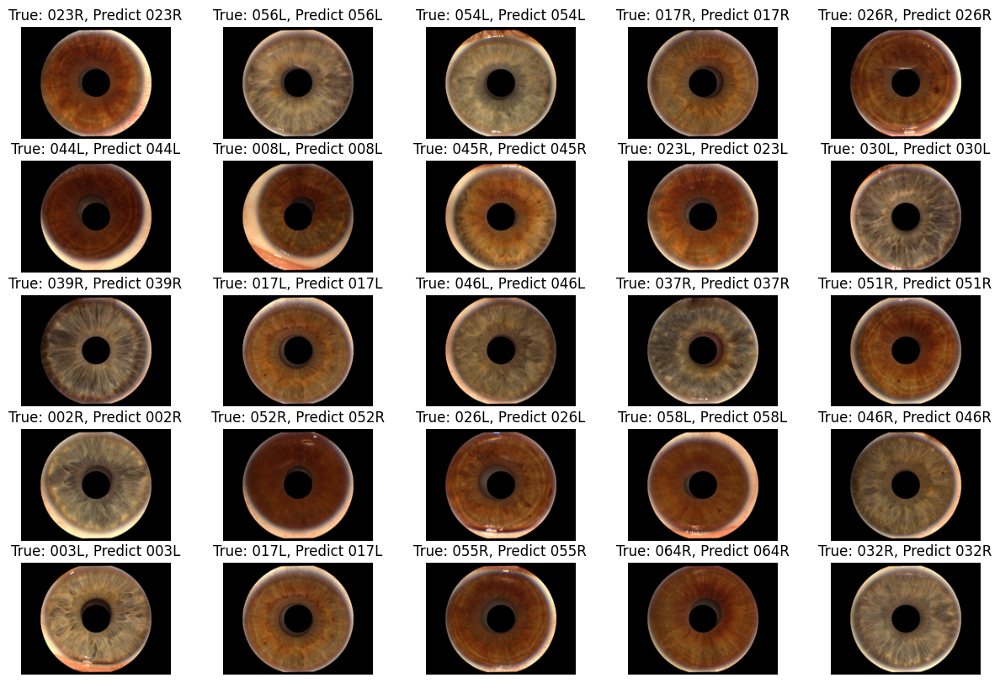

In [ ]:
fig = plt.figure(figsize=(15,10))

for i in range(25):
    n = random.randint(0, len(x_test) - 1)
    img = x_test[n]
    ax = fig.add_subplot(5, 5, i+1)
    ax.imshow(img)
    ax.axis('off')
    img_np = np.array([x_test[n]])
    prediction = model_ResNet.predict(img_np)
    if Classes[np.argmax(y_test[n])] == Classes[np.argmax(prediction)]:
      ax.set_title(f'True: {Classes[np.argmax(y_test[n])]}, Predict {Classes[np.argmax(prediction)]}')
    else:
      ax.set_title(f'False: {Classes[np.argmax(y_test[n])]}, Predict {Classes[np.argmax(prediction)]}')



plt.show()


In [ ]:
scores = model_ResNet.evaluate(x_test, y_test)

4/4 [==============================] - 0s 73ms/step - loss: 0.0642 - accuracy: 0.9844


**Вывод:** точность на первой базе - accuracy: 0.9844

In [ ]:
del y_predict, y_test_classes, y_predict_classes, confusion_mtx

4/4 [==============================] - 0s 70ms/step


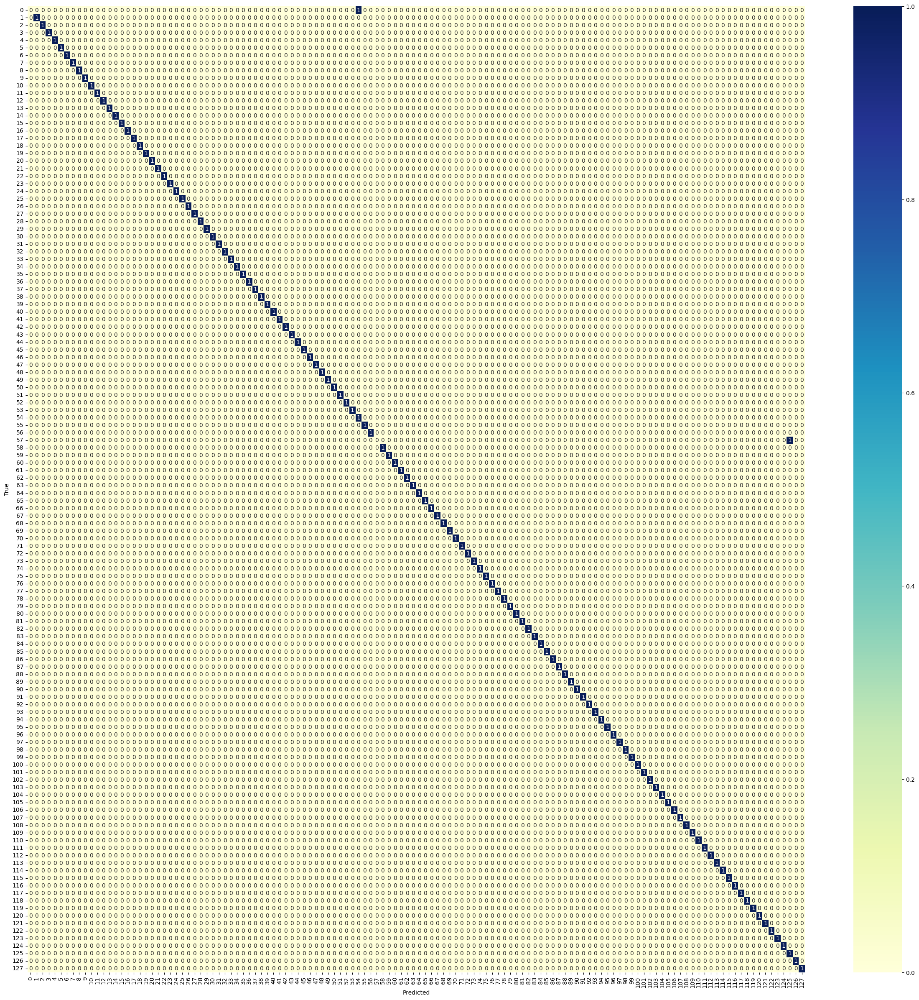

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import tensorflow as tf

y_predict = model_ResNet.predict(x_test);
y_test_classes = [tf.argmax(y_test[i]).numpy() for i in range(len(y_test))]
y_predict_classes = [tf.argmax(y_predict[i]).numpy() for i in range(len(y_predict))]

plt.figure(figsize=(30,30))
confusion_mtx = confusion_matrix(y_test_classes, y_predict_classes)
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='YlGnBu')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [ ]:
model_ResNet.save('/content/drive/MyDrive/Iris_ID/model_ResNet.h5')

In [ ]:
model_ResNet.save('/content/drive/MyDrive/Iris_ID/model_ResNet_ext.h5')

In [ ]:
# # Install and load TensorBoard extension
# !pip install -q tb-nightly
# %load_ext tensorboard

# # Start TensorBoard
# from tensorflow.keras.callbacks import TensorBoard
# log_dir = "/content/drive/MyDrive/IrisID/logs/"  # Replace with your actual logs directory
# tensorboard_callback = TensorBoard(log_dir=log_dir)
# %tensorboard --logdir=log_dir  # Replace with your actual logs directory

# Дообучение Resnet на дополнительной базе

## Обработка новой базы из 25 пациентов


In [28]:
%matplotlib inline

# Загрузка датасета из облака
import gdown
gdown.download('https://drive.google.com/uc?id=1CUe9HZAsGQPCqySZX7zuyJDiS3fqpyBc&authuser', None, quiet=True)

'1920x1080.zip'

In [29]:
# Распаковываем архив Iris_ID.zip в папку Iris_ID
!unzip -q 1920x1080.zip

In [30]:
# импортируем модули
import os;
import shutil;
from PIL import Image;
import numpy as np;
from tensorflow.keras import utils;
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import random

In [32]:
# подготовим метки
base_path = '/content/drive/MyDrive/IrisID/1920x1080';
dataset_path = 'dataset';
labels = [];

for base_dir in os.listdir(base_path):
  for inner_dir in os.listdir(base_path + '/' + base_dir):
    for i_d in os.listdir(base_path + '/' + base_dir + '/' + inner_dir):
      if i_d == 'full':
        for im_name in os.listdir(base_path + '/' + base_dir + '/' + inner_dir + '/' + i_d):
          splited = im_name.split('_');
          name = splited[0] + splited[1];
          dir = dataset_path + '/' + name;

          if os.path.exists(dir) == False:
            os.makedirs(dir);

          labels.append(name);
          shutil.move(base_path + '/' + base_dir + '/' + inner_dir + '/' + i_d + '/' + im_name, dir);

print(labels);

['13left', '13left', '13left', '13left', '13left', '13left', '13left', '13left', '13right', '13right', '13right', '13right', '13right', '13right', '13right', '13right', '15left', '15left', '15left', '15left', '15left', '15left', '15left', '15left', '15right', '15right', '15right', '15right', '15right', '15right', '15right', '15right', '14left', '14left', '14left', '14left', '14left', '14left', '14left', '14left', '14right', '14right', '14right', '14right', '14right', '14right', '14right', '14right', '23left', '23left', '23left', '23left', '23left', '23left', '23left', '23left', '23right', '23right', '23right', '23right', '23right', '23right', '23right', '23right', '17left', '17left', '17left', '17left', '17left', '17left', '17left', '17left', '17right', '17right', '17right', '17right', '17right', '17right', '17right', '17right', '18left', '18left', '18left', '18left', '18left', '18left', '18left', '18left', '18right', '18right', '18right', '18right', '18right', '18right', '18right', '1

In [33]:
# подготовим датасет
x_train_new = [];
y_train_new = [];
NUM_CLASSES = 0;
IMG_WIDTH = 192;
IMG_HEIGHT = 144;

Dirs = os.listdir(dataset_path);

for dir in Dirs:
  for file in os.listdir(dataset_path + '/' + dir):
    im = Image.open(dataset_path + '/' + dir + '/' + file);
    im = im.resize((IMG_WIDTH, IMG_HEIGHT))
    im = im.convert("RGB")

    np_arr = np.array(im);
    x_train_new.append(np_arr);
    y_train_new.append(NUM_CLASSES);

  NUM_CLASSES += 1;

x_train_new = np.array(x_train_new);
x_train_new = x_train_new.reshape(x_train_new.shape[0], 144, 192, 3);

# x_train = x_train / 255.;

# отберём 10% на валидационную выборку
index = int(len(x_train) / 10);
x_val = x_train_new[-index:];

x_val = np.array(x_val);

y_val = y_train_new[-index:];

y_train_new = utils.to_categorical(y_train_new, NUM_CLASSES)
y_train_new = np.array(y_train_new);

y_val = utils.to_categorical(y_val, NUM_CLASSES);
y_val = np.array(y_val);

rand = list(zip(x_val, y_val))
random.shuffle(rand)
x_val, y_val = zip(*rand)

x_val = np.array(x_val)
y_val = np.array(y_val)

print('Размер массива x_train_new', x_train_new.shape);
print('Размер массива y_train_new', y_train_new.shape);
print('Размер массива x_train_new', x_val.shape);
print('Размер массива y_train_new', y_val.shape);

Размер массива x_train_new (400, 144, 192, 3)
Размер массива y_train_new (400, 50)
Размер массива x_train_new (400, 144, 192, 3)
Размер массива y_train_new (400, 50)


In [ ]:
# # Объединяем старые и новые данные
# train_images = np.concatenate((x_train, x_train_new), axis=0)
# # Повторение содержимого y_train_new
# y_train_new_repeated = np.repeat(y_train_new, 32, axis=0)  # Повторение в 32 раза

# # Объединение массивов
# train_labels = np.concatenate((y_train, y_train_new_repeated), axis=1)
# # train_labels = np.concatenate((y_train, y_train_new), axis=0)

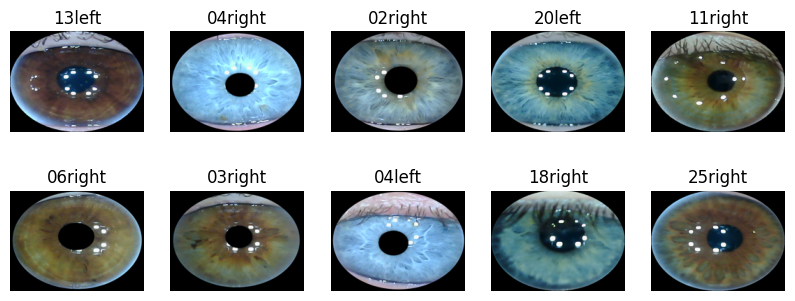

In [ ]:
fig = plt.figure(figsize=(10,10))

for i in range(10):
    n = np.random.randint(0 , x_train_new.shape[0])
    img = x_train_new[n];
    ax = fig.add_subplot(5, 5, i+1);
    label = Dirs[np.argmax(y_train_new[n])];
    ax.set_title(label)
    ax.imshow(img)
    ax.axis('off')
plt.show();


## Обучение только на новой базе

In [ ]:
NUM_CLASSES

50

In [ ]:
model = load_model('/content/drive/MyDrive/Iris_ID/model_ResNet_ext.h5');

In [ ]:
del model

In [ ]:
from tensorflow.keras.layers import Dense

# применяется в модели типа Sequential
# model.summary();
# model.pop();
# model.add(Dense(NUM_CLASSES, activation='softmax'))


# Создание новой модели без последнего слоя
new_model = tf.keras.Model(inputs=model.input, outputs=model.layers[-2].output)

# Получение выхода предыдущего слоя
previous_layer_output = new_model.output

# Добавление последнего слоя
last_layer = Dense(NUM_CLASSES, activation='softmax')(previous_layer_output)
# Обновление модели с новым последним слоем
model = tf.keras.Model(inputs=new_model.input, outputs=last_layer)

# # Зафиксировать веса всех слоев, кроме 2 последнего
# for layer in new_model.layers[:-2]:
#     layer.trainable = False



In [ ]:
model.summary()

In [ ]:
learning_rate = 0.0001
epochs = 20
allValAccuracy = [0.00]  # требуется для callback

Epoch 1/20
13/13 [==============================] - ETA: 0s - loss: 3.5005 - accuracy: 0.3500Веса первой итерации сохранены при значении val_accuracy: 0.032499998807907104
___________________________________________________________________

13/13 [==============================] - 14s 533ms/step - loss: 3.5005 - accuracy: 0.3500 - val_loss: 4.4294 - val_accuracy: 0.0325
Epoch 2/20
13/13 [==============================] - ETA: 0s - loss: 0.5181 - accuracy: 0.9525Текущая скорость обучения: 9.999999747378752e-05

Веса лучшей модели сохранены. Было val_accuracy 0.0325, стало 0.1574999988079071
___________________________________________________________________

13/13 [==============================] - 4s 301ms/step - loss: 0.5181 - accuracy: 0.9525 - val_loss: 4.4245 - val_accuracy: 0.1575
Epoch 3/20
13/13 [==============================] - ETA: 0s - loss: 0.0767 - accuracy: 1.0000Текущая скорость обучения: 9.999999747378752e-05

Веса лучшей модели сохранены. Было val_accuracy 0.1575, стал

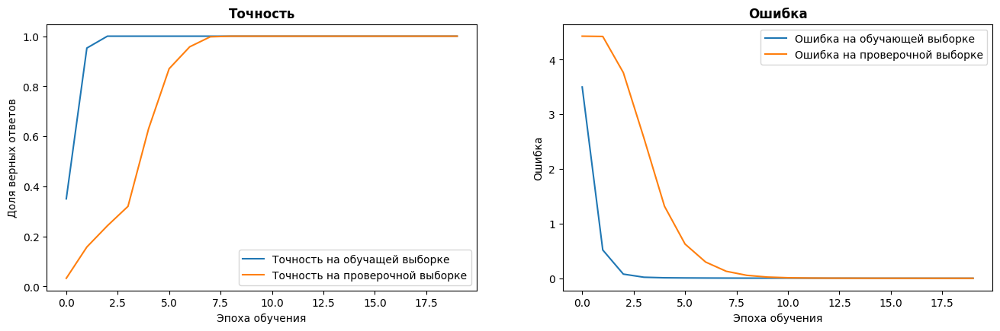

In [ ]:
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
History = model.fit(x_train_new,
                    y_train_new,
                    validation_data=(x_val, y_val),
                    batch_size=32,
                    epochs=epochs,
                    callbacks = callback,
                    verbose=1);

plot_result(History.history['accuracy'],
            History.history['val_accuracy'],
            History.history['loss'],
            History.history['val_loss'])

13/13 [==============================] - 2s 57ms/step


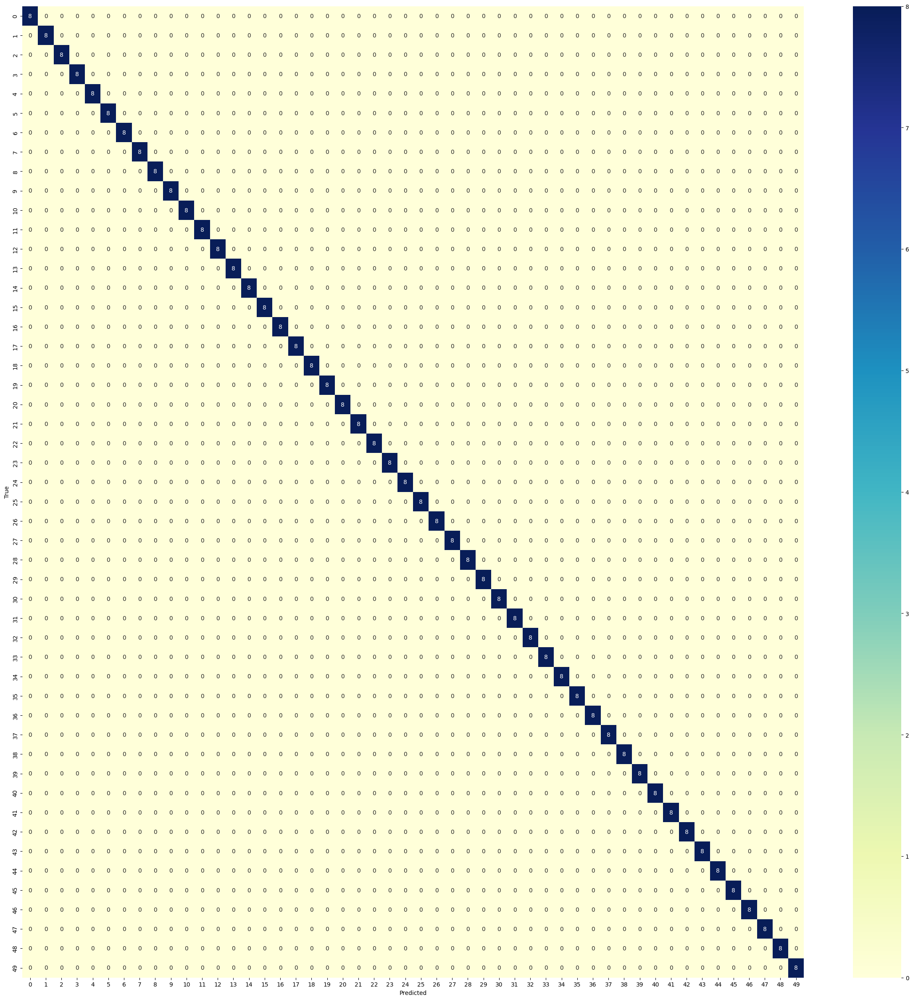

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import tensorflow as tf

y_predict = model.predict(x_train_new);
y_test_classes = [tf.argmax(y_train_new[i]).numpy() for i in range(len(y_train_new))]
y_predict_classes = [tf.argmax(y_predict[i]).numpy() for i in range(len(y_predict))]

plt.figure(figsize=(30,30))
confusion_mtx = confusion_matrix(y_test_classes, y_predict_classes)
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='YlGnBu')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [ ]:
scores = model.evaluate(x_val, y_val)

13/13 [==============================] - 1s 58ms/step - loss: 3.0029e-04 - accuracy: 1.0000


In [ ]:
predictions = np.argmax(model.predict(x_val), axis=1)
y_test_nums = np.argmax(y_val, axis=1)

for i in range(len(x_val)):
    print(f'Предсказано - {predictions[i]}, было {y_test_nums[i]}, {predictions[i] == y_test_nums[i]}')
print(f'\n Процент верных предсказаний - {(predictions == y_test_nums).mean()*100} %')

13/13 [==============================] - 1s 59ms/step
Предсказано - 8, было 8, True
Предсказано - 48, было 48, True
Предсказано - 18, было 18, True
Предсказано - 30, было 30, True
Предсказано - 35, было 35, True
Предсказано - 37, было 37, True
Предсказано - 17, было 17, True
Предсказано - 39, было 39, True
Предсказано - 29, было 29, True
Предсказано - 35, было 35, True
Предсказано - 2, было 2, True
Предсказано - 30, было 30, True
Предсказано - 21, было 21, True
Предсказано - 17, было 17, True
Предсказано - 28, было 28, True
Предсказано - 47, было 47, True
Предсказано - 35, было 35, True
Предсказано - 5, было 5, True
Предсказано - 19, было 19, True
Предсказано - 7, было 7, True
Предсказано - 2, было 2, True
Предсказано - 32, было 32, True
Предсказано - 19, было 19, True
Предсказано - 1, было 1, True
Предсказано - 28, было 28, True
Предсказано - 12, было 12, True
Предсказано - 36, было 36, True
Предсказано - 45, было 45, True
Предсказано - 28, было 28, True
Предсказано - 6, было 6, True


1/1 [==============================] - 0s 22ms/step


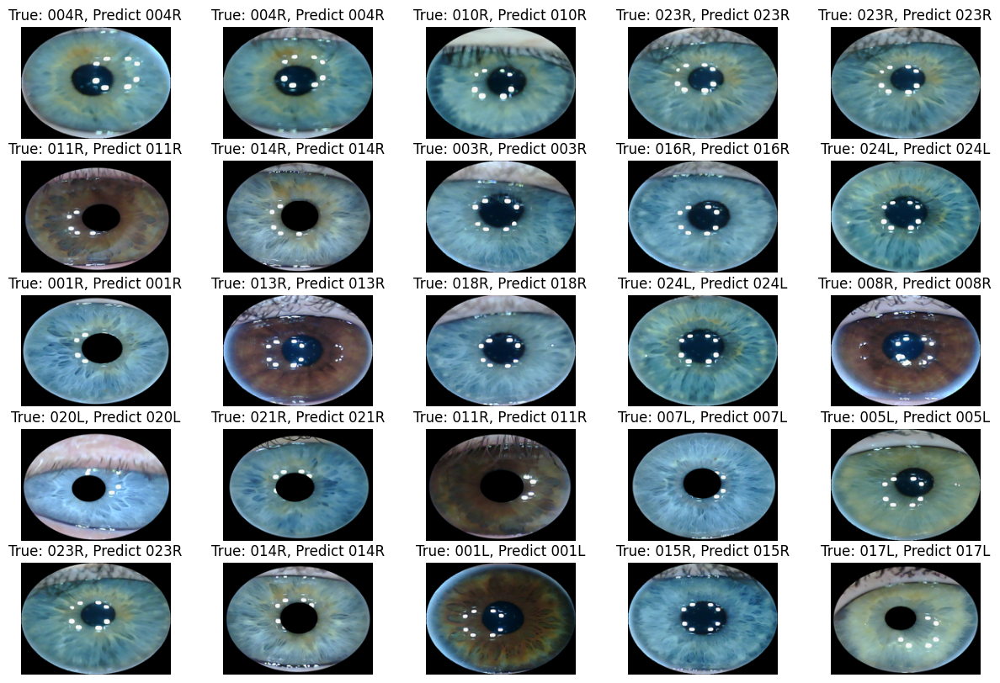

In [ ]:
fig = plt.figure(figsize=(15,10))

for i in range(25):
    n = random.randint(0, len(x_val) - 1)
    img = x_val[n]
    ax = fig.add_subplot(5, 5, i+1)
    ax.imshow(img)
    ax.axis('off')
    img_np = np.array([x_val[n]])
    prediction = model.predict(img_np)
    if Classes[np.argmax(y_val[n])] == Classes[np.argmax(prediction)]:
      ax.set_title(f'True: {Classes[np.argmax(y_val[n])]}, Predict {Classes[np.argmax(prediction)]}')
    else:
      ax.set_title(f'False: {Classes[np.argmax(y_val[n])]}, Predict {Classes[np.argmax(prediction)]}')



plt.show()

Вывод - нейросеть предсказывает 100%.
База слишком маленькая, требуется увеличение

## Дообучение на новой базе с сохранением весов модели, обученной на 64 пациентах

In [34]:
NUM_CLASSES

50

In [35]:
model = load_model('/content/drive/MyDrive/Iris_ID/model_ResNet_ext.h5');

In [40]:
del model

In [41]:
model = model_ResNet

In [42]:
from tensorflow.keras.layers import Dense

# применяется в модели типа Sequential
# model.summary();
# model.pop();
# model.add(Dense(NUM_CLASSES, activation='softmax'))


# Создание новой модели без последнего слоя
new_model = tf.keras.Model(inputs=model.input, outputs=model.layers[-2].output)

# Получение выхода предыдущего слоя
previous_layer_output = new_model.output

# Добавление последнего слоя
last_layer = Dense(NUM_CLASSES, activation='softmax')(previous_layer_output)
# Обновление модели с новым последним слоем
model = tf.keras.Model(inputs=new_model.input, outputs=last_layer)

# Зафиксировать веса всех слоев, кроме 2 последнего
for layer in new_model.layers[:-3]:
    layer.trainable = False



In [43]:
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_32 (InputLayer)          [(None, 144, 192, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 150, 198, 3)  0           ['input_32[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 72, 96, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 72, 96, 64)   256         ['conv1_conv[0][0]']       

### Итерация 1

In [49]:
learning_rate = 0.01
epochs = 20
allValAccuracy = [0.00]  # требуется для callback

Epoch 1/20
12/13 [==========================>...] - ETA: 0s - loss: 31817.2168 - accuracy: 0.0234Веса первой итерации сохранены при значении val_accuracy: 0.019999999552965164
___________________________________________________________________

13/13 [==============================] - 7s 341ms/step - loss: 33230.8984 - accuracy: 0.0225 - val_loss: 50124.0703 - val_accuracy: 0.0200
Epoch 2/20
12/13 [==========================>...] - ETA: 0s - loss: 60316.3633 - accuracy: 0.0234Текущая скорость обучения: 0.009999999776482582
Лучшая модель не изменилась. Mаксимальное val_accuracy: 0.02
___________________________________________________________________

13/13 [==============================] - 1s 115ms/step - loss: 60177.7188 - accuracy: 0.0225 - val_loss: 63383.2383 - val_accuracy: 0.0200
Epoch 3/20
12/13 [==========================>...] - ETA: 0s - loss: 67300.2188 - accuracy: 0.0182Уменьшена скорость обучения. Было: 0.009999999776482582, стало: 0.0091. Причина: потенциальное плато.
Луч

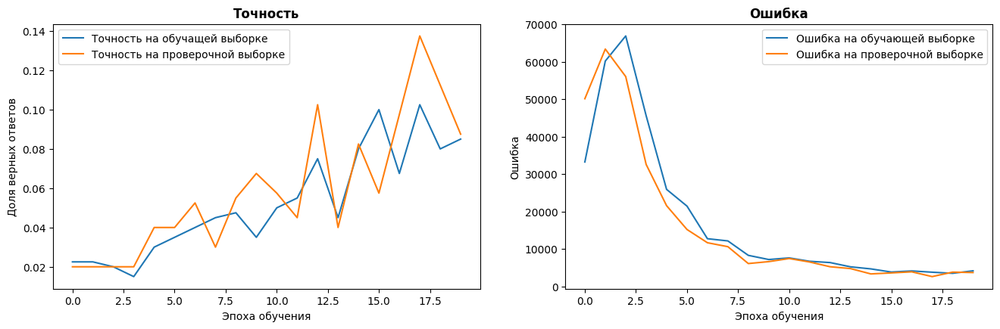

In [50]:
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
History = model.fit(x_train_new,
                    y_train_new,
                    validation_data=(x_val, y_val),
                    batch_size=32,
                    epochs=epochs,
                    callbacks = callback,
                    verbose=1);

plot_result(History.history['accuracy'],
            History.history['val_accuracy'],
            History.history['loss'],
            History.history['val_loss'])

### Итерация 2

In [52]:
# learning_rate = 0.001
epochs = 100

Epoch 1/100
25/25 [==============================] - ETA: 0s - loss: 22542.4629 - accuracy: 0.0875Веса первой итерации сохранены при значении val_accuracy: 0.08749999850988388
___________________________________________________________________

25/25 [==============================] - 8s 182ms/step - loss: 22542.4629 - accuracy: 0.0875 - val_loss: 19512.7793 - val_accuracy: 0.0875
Epoch 2/100
25/25 [==============================] - ETA: 0s - loss: 14205.8916 - accuracy: 0.0900Текущая скорость обучения: 0.009999999776482582

Веса лучшей модели сохранены. Было val_accuracy 0.1375, стало 0.17000000178813934
___________________________________________________________________

25/25 [==============================] - 2s 96ms/step - loss: 14205.8916 - accuracy: 0.0900 - val_loss: 9725.3096 - val_accuracy: 0.1700
Epoch 3/100
25/25 [==============================] - ETA: 0s - loss: 11342.5479 - accuracy: 0.1225Текущая скорость обучения: 0.009999999776482582
Лучшая модель не изменилась. Mаксим

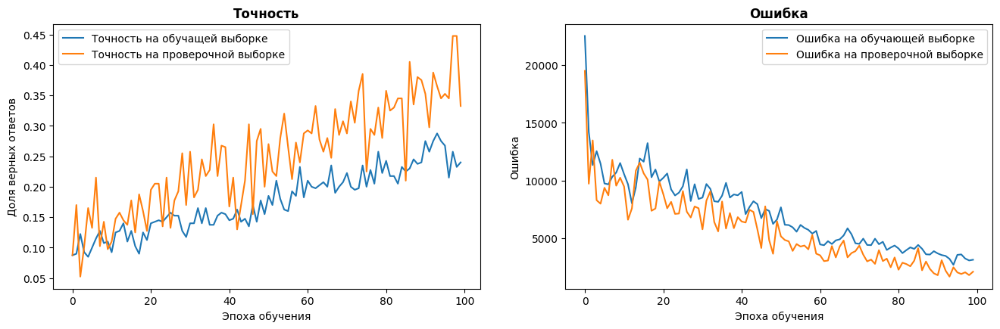

In [54]:
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
History = model.fit(x_train_new,
                    y_train_new,
                    validation_data=(x_val, y_val),
                    batch_size=16,
                    epochs=epochs,
                    callbacks = callback,
                    verbose=1);

plot_result(History.history['accuracy'],
            History.history['val_accuracy'],
            History.history['loss'],
            History.history['val_loss'])

### Итерация 3

In [55]:
learning_rate = 0.0025
epochs = 200


Epoch 1/200
25/25 [==============================] - ETA: 0s - loss: 4028.2295 - accuracy: 0.2200Веса первой итерации сохранены при значении val_accuracy: 0.2574999928474426
___________________________________________________________________

25/25 [==============================] - 7s 177ms/step - loss: 4028.2295 - accuracy: 0.2200 - val_loss: 2753.9534 - val_accuracy: 0.2575
Epoch 2/200
25/25 [==============================] - ETA: 0s - loss: 3317.0522 - accuracy: 0.2100Текущая скорость обучения: 0.0024999999441206455
Лучшая модель не изменилась. Mаксимальное val_accuracy: 0.4475
___________________________________________________________________

25/25 [==============================] - 2s 61ms/step - loss: 3317.0522 - accuracy: 0.2100 - val_loss: 1938.1177 - val_accuracy: 0.3175
Epoch 3/200
25/25 [==============================] - ETA: 0s - loss: 2859.2998 - accuracy: 0.2500Текущая скорость обучения: 0.0024999999441206455
Лучшая модель не изменилась. Mаксимальное val_accuracy: 0.44

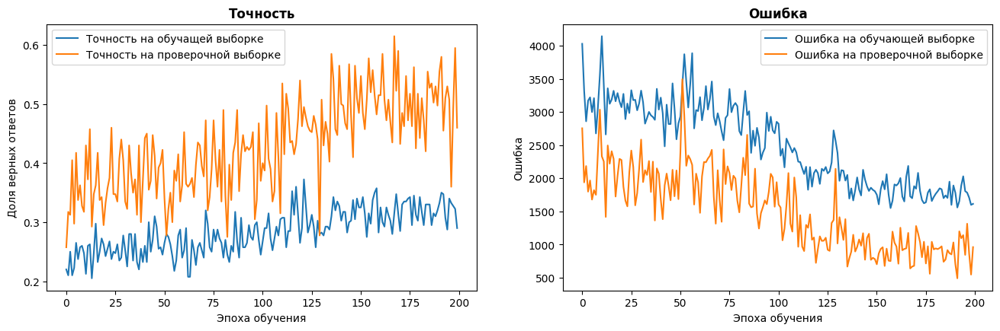

In [56]:
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
History = model.fit(x_train_new,
                    y_train_new,
                    validation_data=(x_val, y_val),
                    batch_size=16,
                    epochs=epochs,
                    callbacks = callback,
                    verbose=1);

plot_result(History.history['accuracy'],
            History.history['val_accuracy'],
            History.history['loss'],
            History.history['val_loss'])

### Итерация 4

In [57]:
learning_rate = 0.008
epochs = 200


Epoch 1/200
50/50 [==============================] - ETA: 0s - loss: 13620.9766 - accuracy: 0.1000Веса первой итерации сохранены при значении val_accuracy: 0.16750000417232513
___________________________________________________________________

50/50 [==============================] - 8s 88ms/step - loss: 13620.9766 - accuracy: 0.1000 - val_loss: 8719.7891 - val_accuracy: 0.1675
Epoch 2/200
49/50 [============================>.] - ETA: 0s - loss: 13467.7236 - accuracy: 0.1224Текущая скорость обучения: 0.00800000037997961
Лучшая модель не изменилась. Mаксимальное val_accuracy: 0.615
___________________________________________________________________

50/50 [==============================] - 2s 39ms/step - loss: 13441.1436 - accuracy: 0.1225 - val_loss: 8727.4805 - val_accuracy: 0.1900
Epoch 3/200
49/50 [============================>.] - ETA: 0s - loss: 11817.5654 - accuracy: 0.1352Текущая скорость обучения: 0.00800000037997961
Лучшая модель не изменилась. Mаксимальное val_accuracy: 0.61

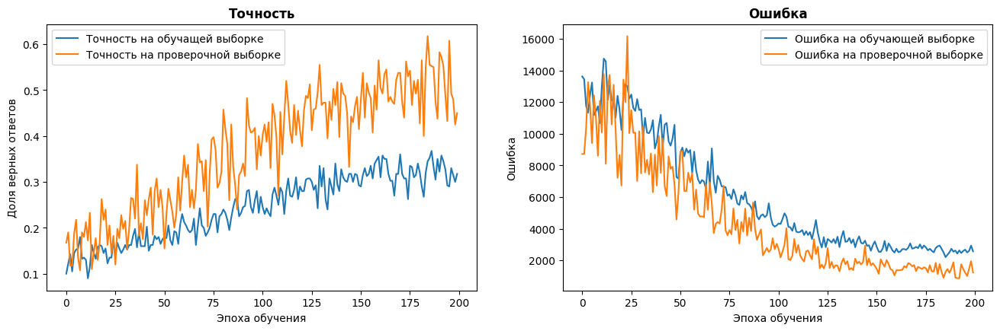

In [58]:
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
History = model.fit(x_train_new,
                    y_train_new,
                    validation_data=(x_val, y_val),
                    batch_size=8,
                    epochs=epochs,
                    callbacks = callback,
                    verbose=1);

plot_result(History.history['accuracy'],
            History.history['val_accuracy'],
            History.history['loss'],
            History.history['val_loss'])

### Итерация 5


Epoch 1/200
25/25 [==============================] - ETA: 0s - loss: 12082.7090 - accuracy: 0.1500Веса первой итерации сохранены при значении val_accuracy: 0.2549999952316284
___________________________________________________________________

25/25 [==============================] - 7s 172ms/step - loss: 12082.7090 - accuracy: 0.1500 - val_loss: 7769.6992 - val_accuracy: 0.2550
Epoch 2/200
25/25 [==============================] - ETA: 0s - loss: 9103.4414 - accuracy: 0.2075Текущая скорость обучения: 0.00800000037997961
Лучшая модель не изменилась. Mаксимальное val_accuracy: 0.6175
___________________________________________________________________

25/25 [==============================] - 2s 63ms/step - loss: 9103.4414 - accuracy: 0.2075 - val_loss: 5995.2954 - val_accuracy: 0.3175
Epoch 3/200
25/25 [==============================] - ETA: 0s - loss: 7310.7573 - accuracy: 0.2100Текущая скорость обучения: 0.00800000037997961
Лучшая модель не изменилась. Mаксимальное val_accuracy: 0.6175

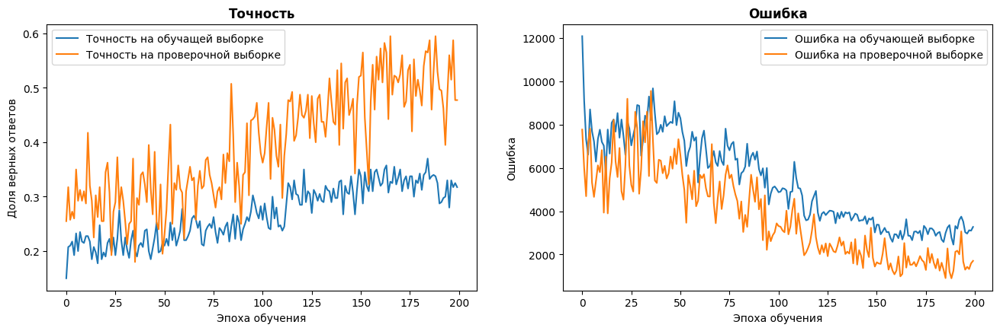

In [59]:
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
History = model.fit(x_train_new,
                    y_train_new,
                    validation_data=(x_val, y_val),
                    batch_size=16,
                    epochs=epochs,
                    callbacks = callback,
                    verbose=1);

plot_result(History.history['accuracy'],
            History.history['val_accuracy'],
            History.history['loss'],
            History.history['val_loss'])

### Итерация 6


In [63]:
epochs=1000
learning_rate = 0.0023

Выходные данные были обрезаны до нескольких последних строк (5000).
Epoch 169/1000
25/25 [==============================] - ETA: 0s - loss: 3056.1069 - accuracy: 0.3225Текущая скорость обучения: 0.002300000051036477
Лучшая модель не изменилась. Mаксимальное val_accuracy: 0.64
___________________________________________________________________

25/25 [==============================] - 2s 64ms/step - loss: 3056.1069 - accuracy: 0.3225 - val_loss: 1382.1031 - val_accuracy: 0.4900
Epoch 170/1000
25/25 [==============================] - ETA: 0s - loss: 2747.8818 - accuracy: 0.3400Текущая скорость обучения: 0.002300000051036477
Лучшая модель не изменилась. Mаксимальное val_accuracy: 0.64
___________________________________________________________________

25/25 [==============================] - 2s 64ms/step - loss: 2747.8818 - accuracy: 0.3400 - val_loss: 1765.6301 - val_accuracy: 0.4400
Epoch 171/1000
25/25 [==============================] - ETA: 0s - loss: 2960.1428 - accuracy: 0.2800Теку

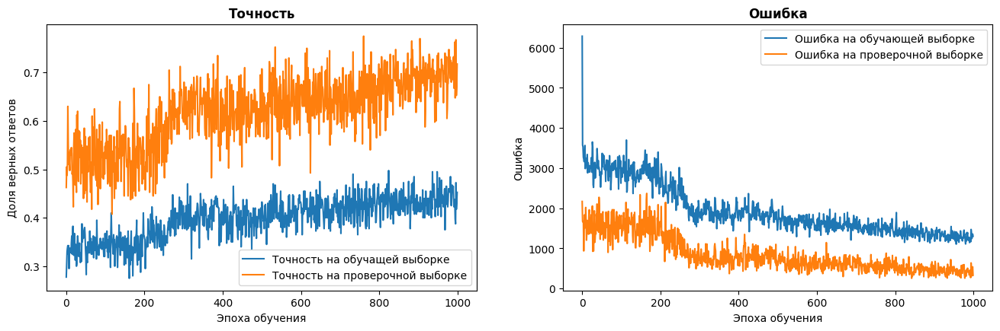

In [64]:
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
History = model.fit(x_train_new,
                    y_train_new,
                    validation_data=(x_val, y_val),
                    batch_size=16,
                    epochs=epochs,
                    callbacks = callback,
                    verbose=1);

plot_result(History.history['accuracy'],
            History.history['val_accuracy'],
            History.history['loss'],
            History.history['val_loss'])

### Итерация 7


In [93]:
model.load_weights('/content/drive/MyDrive/temp/best_weight.h5')

Подправим callback для еще большего уменьшения шага обучения

In [94]:
def on_epoch_end(epoch, logs):

  # Начиная с первой эпохи делаем дополнительную логику
  if epoch > 0:

    # Изменяем шаг обучения, если начинается “пила” на графике
    # или график выходит на плато.
    oldLr = model.optimizer.lr.numpy()
    cause = False
    # Что характеризует пилу? Идущее вниз значение val_accuracy.
    if allValAccuracy[epoch - 1] > logs['val_accuracy']:
      cause = 'потенциальная пила'
    # А любое плато начинается с первого ровного участка.
    elif allValAccuracy[epoch - 1] == logs['val_accuracy']:
      cause = 'потенциальное плато'
    if cause:
      # Выводим уведомление, что скорость обучения снижена.
      newLr = oldLr / 1.1
      model.optimizer.learning_rate.assign(newLr)
      print('Уменьшена скорость обучения. Было: {}, стало: {}. Причина: {}.'.format(oldLr, newLr, cause))
      oldLr = newLr
    else:
      print('Текущая скорость обучения: {}'.format(round(oldLr, 8)))


    # Сохраняем сеть с лучшей точностью в .h5 файл.
    maxValAccuracy = max(allValAccuracy)
    if maxValAccuracy < logs['val_accuracy']:
      model.save_weights('/content/drive/MyDrive/temp/best_weight.h5')
      print('\nВеса лучшей модели сохранены. Было val_accuracy {}, стало {}'.format(round(maxValAccuracy, 4), logs['val_accuracy']))
    else:
      print('Лучшая модель не изменилась. Mаксимальное val_accuracy: {}'.format(round(maxValAccuracy, 4)))

  # Для нулевой эпохи - просто сохраняем веса модели.
  else:
    model.save_weights('/content/drive/MyDrive/temp/best_weight.h5')
    print('Веса первой итерации сохранены при значении val_accuracy: {}'
    .format(logs['val_accuracy']))

  # Сохраняем текущие значения val_accuracy
  allValAccuracy.append(logs['val_accuracy'])

  print("___________________________________________________________________\n")


##################################################################
##################################################################

# Каллбэки
callback = LambdaCallback(on_epoch_end=on_epoch_end)

In [95]:
epochs=100
learning_rate = 0.0003
allValAccuracy = [0.87]  # требуется для callback

Epoch 1/100
25/25 [==============================] - ETA: 0s - loss: 927.7517 - accuracy: 0.4875Веса первой итерации сохранены при значении val_accuracy: 0.7950000166893005
___________________________________________________________________

25/25 [==============================] - 6s 131ms/step - loss: 927.7517 - accuracy: 0.4875 - val_loss: 139.2134 - val_accuracy: 0.7950
Epoch 2/100
25/25 [==============================] - ETA: 0s - loss: 839.0089 - accuracy: 0.5100Уменьшена скорость обучения. Было: 0.0003000000142492354, стало: 0.0002727272856811231. Причина: потенциальная пила.
Лучшая модель не изменилась. Mаксимальное val_accuracy: 0.87
___________________________________________________________________

25/25 [==============================] - 2s 63ms/step - loss: 839.0089 - accuracy: 0.5100 - val_loss: 213.1684 - val_accuracy: 0.7750
Epoch 3/100
25/25 [==============================] - ETA: 0s - loss: 788.4802 - accuracy: 0.5200Текущая скорость обучения: 0.00027272998704575
Луч

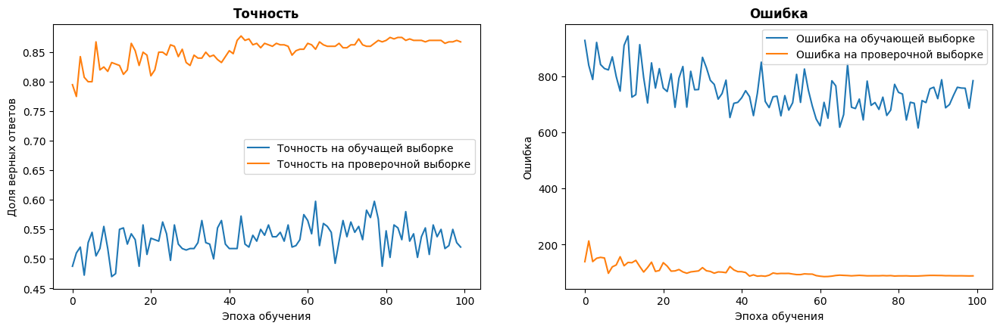

In [96]:
model.compile(optimizer=Adam(learning_rate=learning_rate),
              loss='categorical_crossentropy',
              metrics=['accuracy'])
History = model.fit(x_train_new,
                    y_train_new,
                    validation_data=(x_val, y_val),
                    batch_size=16,
                    epochs=epochs,
                    callbacks = callback,
                    verbose=1);

plot_result(History.history['accuracy'],
            History.history['val_accuracy'],
            History.history['loss'],
            History.history['val_loss'])

### Проверка на тестовой выборке

13/13 [==============================] - 2s 58ms/step


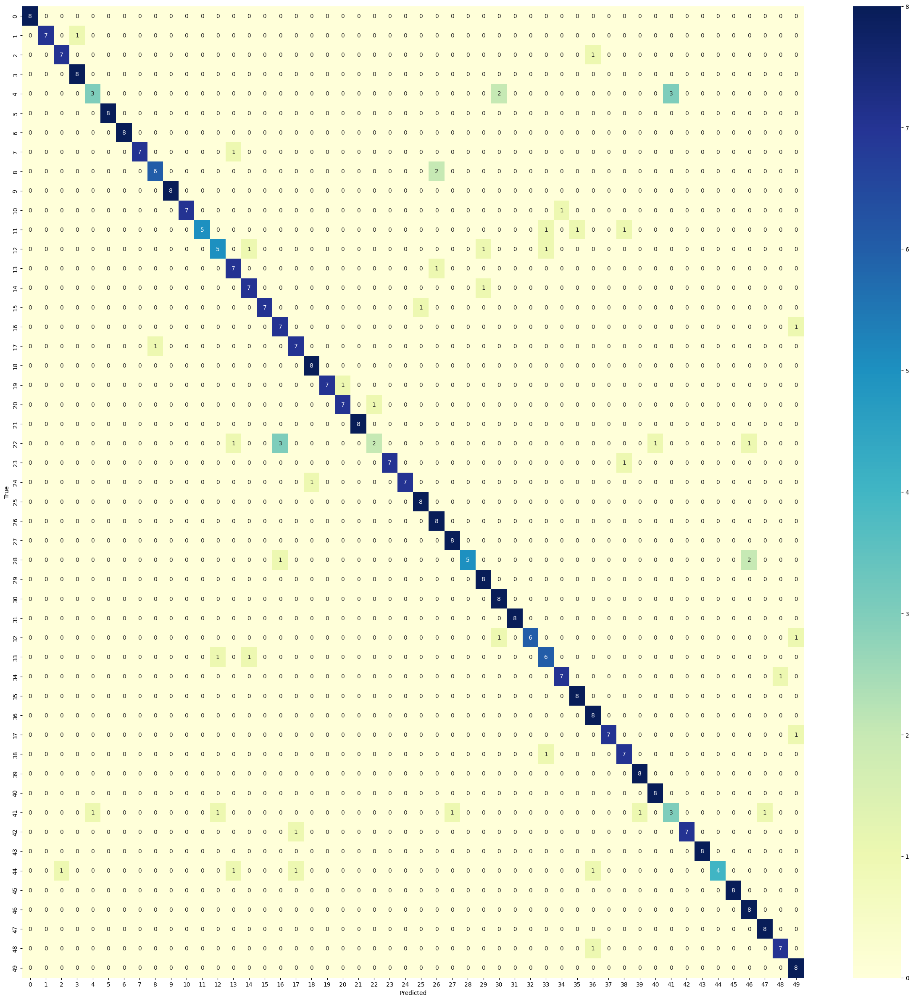

In [97]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import tensorflow as tf

y_predict = model.predict(x_train_new);
y_test_classes = [tf.argmax(y_train_new[i]).numpy() for i in range(len(y_train_new))]
y_predict_classes = [tf.argmax(y_predict[i]).numpy() for i in range(len(y_predict))]

plt.figure(figsize=(30,30))
confusion_mtx = confusion_matrix(y_test_classes, y_predict_classes)
sns.heatmap(confusion_mtx, annot=True, fmt='g', cmap='YlGnBu')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [99]:
scores = model.evaluate(x_val, y_val)

13/13 [==============================] - 1s 60ms/step - loss: 88.6521 - accuracy: 0.8675


1/1 [==============================] - 0s 24ms/step


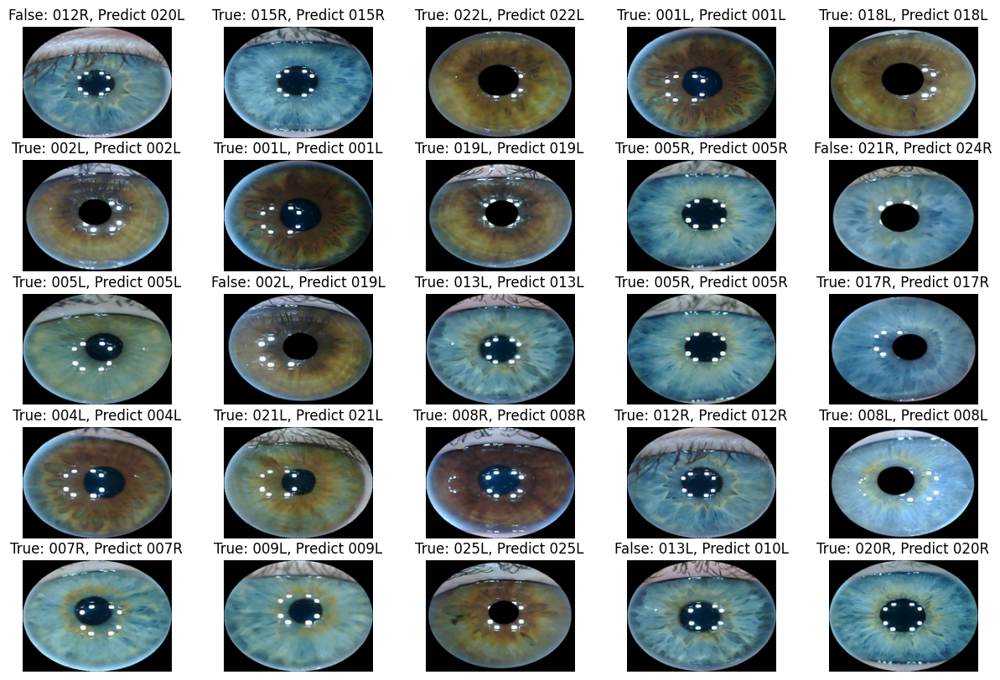

In [101]:
fig = plt.figure(figsize=(15,10))

for i in range(25):
    n = random.randint(0, len(x_val) - 1)
    img = x_val[n]
    ax = fig.add_subplot(5, 5, i+1)
    ax.imshow(img)
    ax.axis('off')
    img_np = np.array([x_val[n]])
    prediction = model.predict(img_np)
    if Classes[np.argmax(y_val[n])] == Classes[np.argmax(prediction)]:
      ax.set_title(f'{True}: {Classes[np.argmax(y_val[n])]}, Predict {Classes[np.argmax(prediction)]}')
    else:
      ax.set_title(f'False: {Classes[np.argmax(y_val[n])]}, Predict {Classes[np.argmax(prediction)]}')



plt.show()

**Вывод** - нейросеть предсказывает 86%.
Требуется базу готовить однородную - либо как с круглыми лампами в первой базе, либо как с точечными светильниками во второй.

# Проверка работы нейросети

Вернемся к нейросети Resnet с точностью 98.44% на первой базе

## Проверка на изображении из тестовой выборки первой базы

Не разобрался, что такое FAR/FRR. Нужно поправить условие, чтобы добавить.
Оставил только допуск/недопуск

In [163]:
def check_probability(probability):
  # Установка пороговых значений
  threshold_prediction = 0.97
  threshold_far = 0.02
  threshold_frr = 0.03

  # Проверка результатов
  if probability < threshold_prediction:
      status = 'Нет в базе'
      print("Недопуск: Пациент отсутствует в базе")
  else:
      # if probability > threshold_far:
      #     status = 'Ложный допуск'
      #     print('Ложный допуск: Пациент не зарегистрирован, но система его идентифицировала')
      # elif probability < threshold_frr:
      #     status = 'Ложный недопуск'
      #     print('Ложный недопуск: Пациент зарегистрирован, но система не идентифицировала его')
      # else:
    status = 'Success'
    print("Идентификация пациента успешна")

  return status

# Вероятность, Предсказанный номер класса, Исходный класс, Предсказанный класс
1/1 [==============================] - 0s 27ms/step
Идентификация пациента успешна
0.9999827 126 064L 064L
1/1 [==============================] - 0s 25ms/step
Идентификация пациента успешна
0.9999962 29 015R 015R
1/1 [==============================] - 0s 26ms/step
Идентификация пациента успешна
0.999984 41 021R 021R
1/1 [==============================] - 0s 28ms/step
Идентификация пациента успешна
0.9991743 40 021L 021L
1/1 [==============================] - 0s 33ms/step
Идентификация пациента успешна
0.9999964 68 035L 035L
1/1 [==============================] - 0s 27ms/step
Идентификация пациента успешна
0.99998355 15 008R 008R
1/1 [==============================] - 0s 29ms/step
Недопуск: Пациент отсутствует в базе
0.9095445 17 009R 009R
1/1 [==============================] - 0s 29ms/step
Недопуск: Пациент отсутствует в базе
0.6269476 72 037L 037L
1/1 [==============================] - 0s 44ms/step
Идентифи

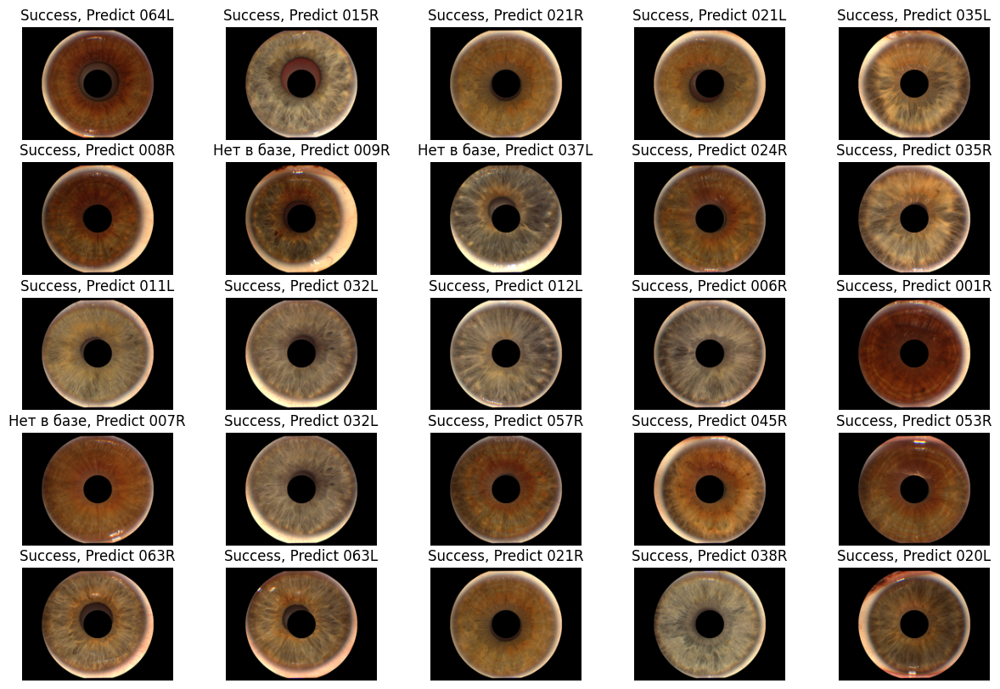

In [172]:
fig = plt.figure(figsize=(15,10))
print('# Вероятность, Предсказанный номер класса, Исходный класс, Предсказанный класс')
for i in range(25):
    n = random.randint(0, len(x_test) - 1)
    img = x_test[n]
    ax = fig.add_subplot(5, 5, i+1)
    ax.imshow(img)
    ax.axis('off')
    img_np = np.array([x_test[n]])
    prediction = model_ResNet.predict(img_np)
    predicted_class = tf.argmax(prediction, axis=1).numpy()[0]
    probability = prediction[0][predicted_class]
    status = check_probability(probability)
    ax.set_title(f'{status}, Predict {Classes[np.argmax(prediction)]}')

    # Вероятность,      номер класса,         Исходный класс,              Предсказанный класс
    print(probability, predicted_class, Classes[np.argmax(y_test[n])], Classes[np.argmax(prediction)])
plt.show()

## Проверка на пациенте из другой базы

In [166]:
# Загрузка изображения незарегистрированного пациента (из второй базы)
n = random.randint(0, len(x_val) - 1)
img = x_val[n]
img_np = np.array([x_val[n]])
np.argmax(y_val[n])
# prediction = model.predict(img_np)
# Classes[np.argmax(y_val[n])] == Classes[np.argmax(prediction)]:


1/1 [==============================] - 0s 27ms/step
Недопуск: Пациент отсутствует в базе
1/1 [==============================] - 0s 28ms/step
Недопуск: Пациент отсутствует в базе
1/1 [==============================] - 0s 27ms/step
Недопуск: Пациент отсутствует в базе


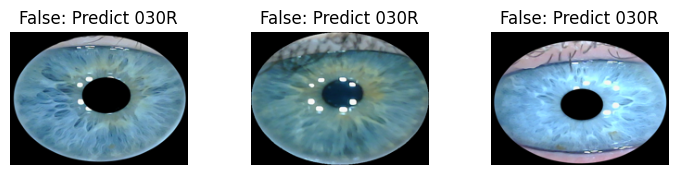

In [173]:
fig = plt.figure(figsize=(15,10))

for i in range(3):
    n = random.randint(0, len(x_val) - 1)
    img = x_val[n]
    ax = fig.add_subplot(5, 5, i+1)
    ax.imshow(img)
    ax.axis('off')
    img_np = np.array([x_val[n]])
    prediction = model_ResNet.predict(img_np)
    # Нужно сравнить разные
    if np.argmax(y_val[n]) == np.argmax(prediction):
      ax.set_title(f'True: Predict {Classes[np.argmax(prediction)]}')
      print("Идентификация пациента успешна")
    else:
      ax.set_title(f'False: Predict {Classes[np.argmax(prediction)]}')
      print("Недопуск: Пациент отсутствует в базе")



plt.show()

# Выводы

1.   Была проведена обработка первой базы - удаление засветки зрачка и удаление выступа на контуре фото. Идея была в том, чтобы приблизить базу ко второй - с точечными источниками света.
2.   Попробовал архитектуры VGG16, Resnet50 и самописную CNN (в данной отчете отсутствует из-за низкой точности ~70%). Лучшие данные были получены на Resnet50 - точность на первой базе 98,44%.
3. Обучение лучше проводить на базе фотографий, подготовленной на одном оборудовании. При обучении с разными базами убедился в несовместимости весов нейросетей.
4. Максимальная точность после дообучения (fine tuning) малой базой с сохранением весов предобученной модели - 87.75%
5. Реализован анализ фотографии, определение статуса на основе вероятности идентификации.



